In [1]:
import pandas as pd
import time
import numpy as np
import matplotlib.pyplot as plt
from cr_data_inspection_functions import *
from lwa_antpos import reading
import scipy.stats as st
import math
import yaml
import os
import numpy.lib.recfunctions as rfn
import scipy.signal as sg

from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter
from matplotlib.backends.backend_pdf import PdfPages

dataproductsdir='/lustre/kplant/2024October23-dataproducts/'
datadir='/lustre/kplant/2024October23/'
config=dataproductsdir+'config.yml'


with open(config, 'r') as file:
    configuration=yaml.safe_load(file)
#array_map_filename=configuration['array_map_filename'] 
array_map_filename='/home/kplant/lwa-cosmic-rays/array-map-5-22-2023.csv'
h=np.asarray(configuration['filter'])

lwa_df = reading.read_antpos()
namedict=build_mapping_dictionary(lwa_df)

array_map=pd.read_csv(array_map_filename)
xdict={}
ydict={}
zdict={}
for i,n in enumerate(array_map['antname']):
    xdict[n]=array_map['x'][i]
    ydict[n]=array_map['y'][i]
    zdict[n]=array_map['elevation'][i]
arraymapdictionaries=[xdict,ydict,zdict]

fs= 196 #MHz

Read antpos from default source


In [2]:
def simple_direction_fit(anntenna_summary_array,plot=True,toa_func=toa_plane,fitbounds=([0,0],[90,360]),weightbysnr=False,usecolumn='tpeak_rel'):
    #to run the direction fit code,I need arrays of x,y,z, t which are all with respect to a reference antenna
    #I will use the first non-flagged antenna as the reference
    
    #set up coordinate array, with respect to a reference antenna
    print('Reference antenna',anntenna_summary_array['antname'][0])
    t_ref=anntenna_summary_array[usecolumn][0]
    x_ref=anntenna_summary_array['x'][0]
    y_ref=anntenna_summary_array['y'][0]
    z_ref=anntenna_summary_array['z'][0]
    x=anntenna_summary_array['x'] - x_ref
    y=anntenna_summary_array['y'] - y_ref
    z=anntenna_summary_array['z'] - z_ref
    t=anntenna_summary_array[usecolumn] - t_ref
    ant_coords=np.zeros((3,len(x)))
    ant_coords[0,:]=x
    ant_coords[1,:]=y
    ant_coords[2,:]=z

    #calculate weights
    if weightbysnr:
        w=1/anntenna_summary_array['snr']
        weights=(w)/np.mean(w)
    else:
        weights=np.ones(len(t))
    
    popt, pcov = curve_fit(toa_func, ant_coords,t,bounds=fitbounds,sigma=weights)
    best_model_toas=toa_func(ant_coords,*popt)
    residual=t-best_model_toas
    
    if plot:
        #plot the results
        czoom_min=-50
        czoom_max=50
        title='Fit with '+str(toa_func)[10:-19]
        plot_fit(x,y,t,best_model_toas,residual,-40,40,title)
        
    return popt,pcov,residual,[x_ref,y_ref,z_ref,t_ref]


def robust_direction_fit(antenna_summary_array,niter,outlier_limit,toa_func=toa_plane,fitbounds=([0,0],[90,360]),plot=True,weightbysnr=False,usecolumn='tpeak_rel'):
    current_ant_summary_array=antenna_summary_array
    for n in range(niter):
        #do fit
        popt,pcov,residual,reference=simple_direction_fit(current_ant_summary_array,plot,toa_func,fitbounds,weightbysnr,usecolumn=usecolumn)
        rms_residual=np.sqrt(np.mean(np.square(residual)))
        
        w=1/current_ant_summary_array['snr']
        weights=(w)/np.mean(w)
        weightedresidual=residual/weights
        weighted_rms_residual=np.sqrt(np.mean(np.square(weightedresidual)))
        
        #calculate outliers
        antpols=np.asarray([current_ant_summary_array['antname'][i]+current_ant_summary_array['pol'][i] for i in range(len(residual))])
        residual_med=np.median(residual)
        abs_dev_from_med=np.abs(residual-residual_med)
        residual_MAD=np.median(abs_dev_from_med)
        outliers=antpols[abs_dev_from_med>outlier_limit*residual_MAD]
        
        #do plots, if desired
        if plot==True:
            #print details
            print('iteration: ',n,' rms residual: ',rms_residual, ' n outliers: ',len(outliers))
            print('popt: ',popt)
            print('pcov: ',pcov)
            plt.figure(figsize=(15,5))
            plt.subplot(131)
            plt.hist(residual)
            plt.xlabel('Residual')
            plt.subplot(132)
            plt.plot(current_ant_summary_array['snr'],residual,',')
            plt.ylabel('Residual [clock cycles]')
            plt.xlabel('SNR')
            plt.subplot(133)
            plt.plot(np.sqrt(current_ant_summary_array['distance']),residual,',')
            plt.ylabel('Residual [clock cycles]')
            plt.xlabel('Distance [m]')
        
        #flag for the next iteration
        #The only purpose of flagging at this stage is removing outliers, so the other parameters are set to values that should encompass everything.  In most cases, by the time robust_spatial_fit is being applied, stricter antenna flagging has already occured. 
        if n<niter-1:
            current_ant_summary_array=flag_antennas(current_ant_summary_array,1e9, 0,-1000,1000,1000,outliers)[0]


    return popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference

In [3]:
configuration['minsnr']


5.5

## Select an event to use
Load event data, display the quickanalysis results, do some standard flagging, and select the bright antennas of the dominant polarization.

See the notebook from the corresponding date (and the reprocessing notebook) for how this event was determined to be a good example.

Reference antenna LWA-127
Reference antenna LWA-127
Reference antenna LWA-127
arrival direction azimuth  19.102 +- 0.036 degree
Gaussian semimajor axis azimuth  180.0 +- 1245.813 degree
Arrival direction ZA  38.94 +- 0.104 degree
Gaussian aspect ratio  1.131 +- 0.236
Gaussian fit rms residual  0.999
TOA fit rms residual  1.288 rms of residual weighted by snr 1.27171607240681


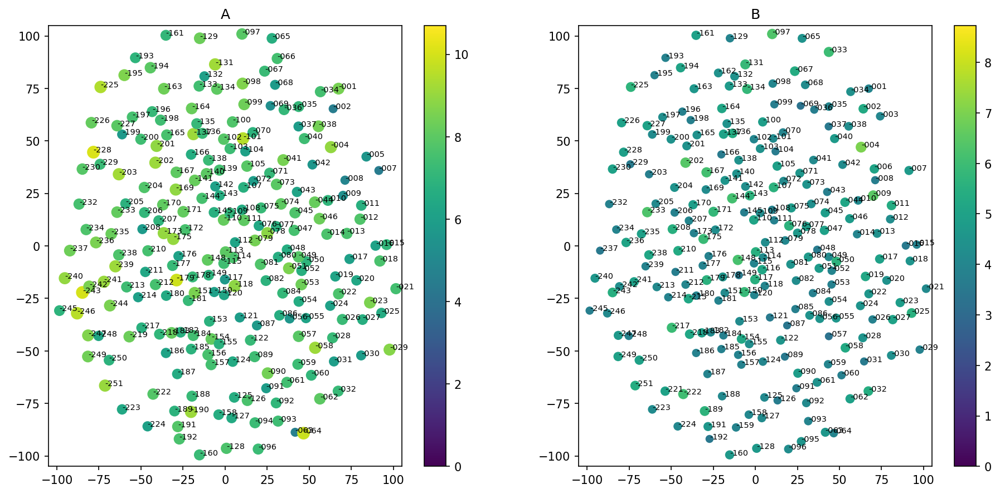

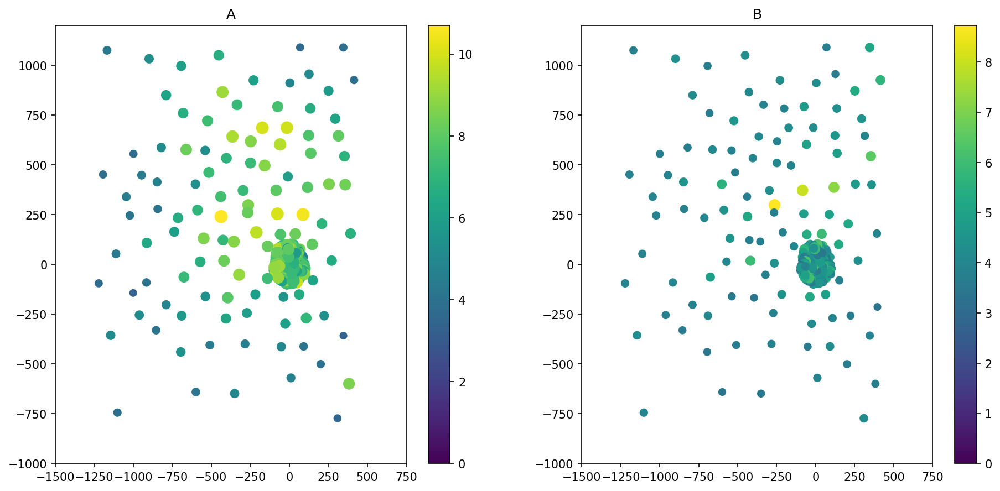

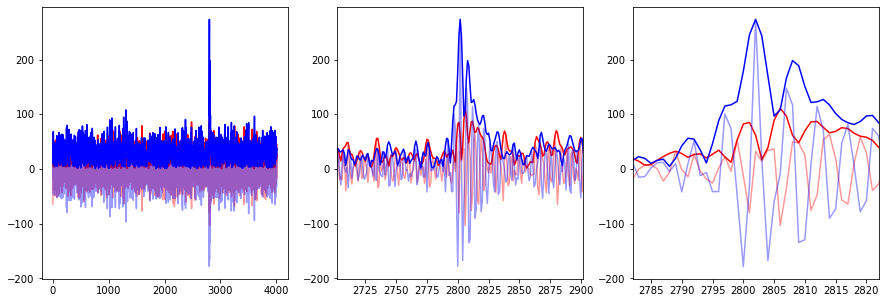

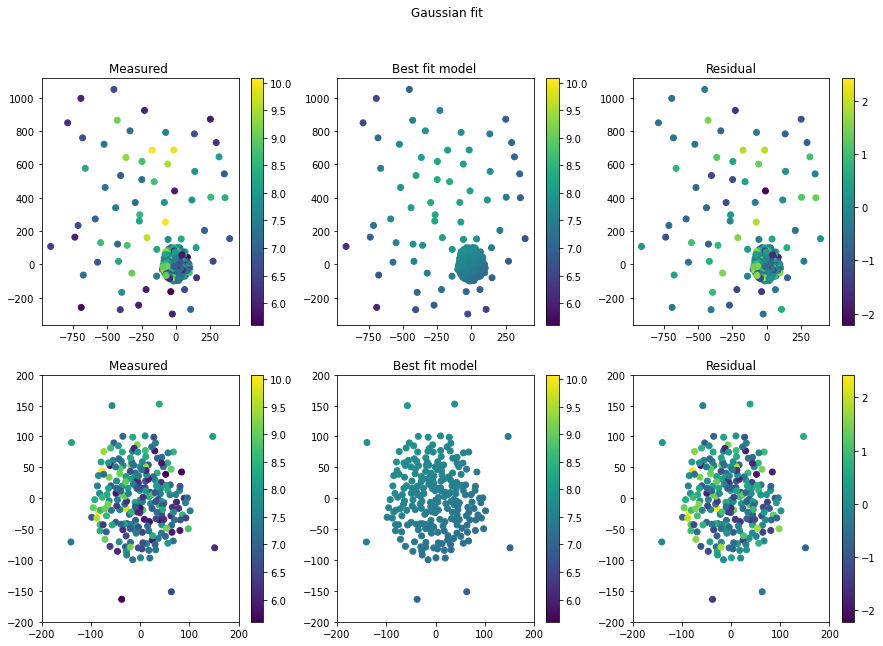

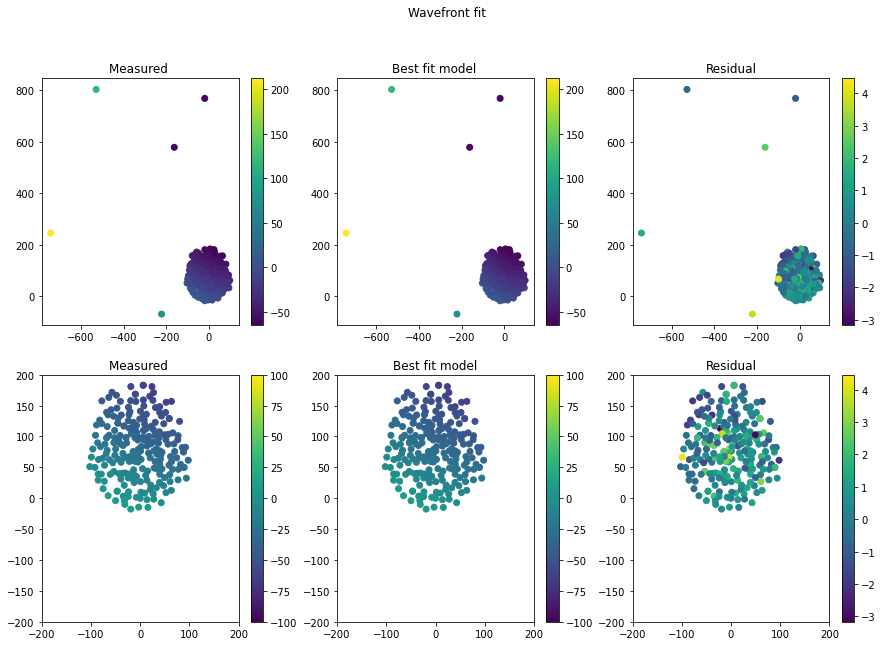

In [4]:
#good event
datafile = '/lustre/kplant/2024October23/overnight1729783099.6500294.dat' 
index_in_file=537069
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

#problem event
#datafile = '/lustre/kplant/2024October23/overnight1729757059.6939254.dat' 
#index_in_file=29665
#quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

In [5]:
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

In [6]:
minsnr=configuration['minsnr']

bright=event_summary_flagged[event_summary_flagged['snr']>minsnr]
brightpolA=bright[bright['pol']=='A']
brightpolB=bright[bright['pol']=='B']

if len(brightpolA)>len(brightpolB):
    useforfit=brightpolA
    strongpol='A'
else:
    useforfit=brightpolB
    strongpol='B'
print(len(bright),len(brightpolA),len(brightpolB),len(useforfit))

323 288 35 288


## Find the correlator delays for these antennas

In [7]:
#XX is A pol, YY is B pol
corr=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')
if strongpol=='A':
    corrdelays=corr[0,:]
if strongpol=='B':
    corrdelays=corr[1,:]
    
#make a list of the correlator delays in the order that the antennas appear in my event data array
corrdelays_reordered=np.asarray([corrdelays[mapping.antname_to_correlator(a)] for a in useforfit['antname']])
#convert to clock cycles
corrdelays_sign=(-1)*fs*corrdelays_reordered #change to the sign convention that I use for delays and convert to clock cycles

#Add the delays and a delay-calibrated column to the event data array
t_corrected=useforfit['tpeak_rel']-corrdelays_sign
useforfit=rfn.append_fields(useforfit,'CorrelatorDelay',data=corrdelays_sign,dtypes=np.float64)
useforfit=rfn.append_fields(useforfit,'tpeak_calibrated',data=t_corrected,dtypes=np.float64)

#keep only the ones that have a delay solution
print(len(useforfit))
useforfit=useforfit[useforfit['tpeak_calibrated']>=0]
print(len(useforfit))


288
277


In [15]:
print(useforfit['antname'])

['LWA-127' 'LWA-126' 'LWA-259' 'LWA-001' 'LWA-234' 'LWA-133' 'LWA-028'
 'LWA-247' 'LWA-268' 'LWA-173' 'LWA-034' 'LWA-260' 'LWA-076' 'LWA-004'
 'LWA-180' 'LWA-032' 'LWA-137' 'LWA-081' 'LWA-031' 'LWA-179' 'LWA-125'
 'LWA-128' 'LWA-153' 'LWA-181' 'LWA-188' 'LWA-154' 'LWA-157' 'LWA-156'
 'LWA-155' 'LWA-158' 'LWA-182' 'LWA-160' 'LWA-184' 'LWA-187' 'LWA-136'
 'LWA-177' 'LWA-135' 'LWA-267' 'LWA-079' 'LWA-176' 'LWA-138' 'LWA-266'
 'LWA-078' 'LWA-030' 'LWA-212' 'LWA-161' 'LWA-060' 'LWA-269' 'LWA-107'
 'LWA-141' 'LWA-211' 'LWA-057' 'LWA-140' 'LWA-183' 'LWA-109' 'LWA-273'
 'LWA-056' 'LWA-213' 'LWA-271' 'LWA-165' 'LWA-108' 'LWA-243' 'LWA-277'
 'LWA-010' 'LWA-111' 'LWA-058' 'LWA-164' 'LWA-282' 'LWA-012' 'LWA-114'
 'LWA-186' 'LWA-062' 'LWA-163' 'LWA-281' 'LWA-214' 'LWA-113' 'LWA-061'
 'LWA-217' 'LWA-278' 'LWA-166' 'LWA-059' 'LWA-112' 'LWA-193' 'LWA-285'
 'LWA-038' 'LWA-115' 'LWA-064' 'LWA-219' 'LWA-198' 'LWA-118' 'LWA-185'
 'LWA-042' 'LWA-087' 'LWA-167' 'LWA-117' 'LWA-218' 'LWA-308' 'LWA-086'
 'LWA-

Text(0, 0.5, 'Delay [microseconds]')

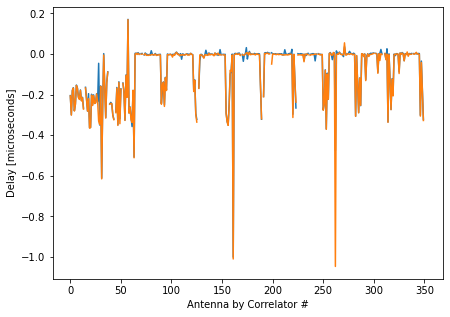

In [14]:
plt.figure(figsize=(7,5))
plt.plot(corr[0,:])
plt.plot(corr[1,:])
plt.xlabel('Antenna by Correlator #')
plt.ylabel('Delay [microseconds]')

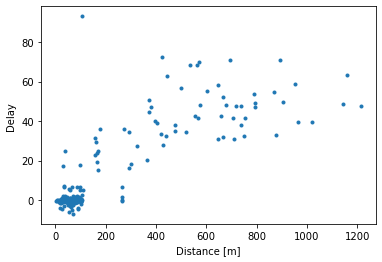

In [13]:
plt.plot(np.sqrt(useforfit['distance']),useforfit['CorrelatorDelay'], '.')
plt.xlabel('Distance [m]')
plt.ylabel('Delay [Clock cycles] ')

plt.show()

To check that I've matched this properly, I'm checking that antenna LWA-114 has ~0 correlator delay, since it is the reference antenna in the correlator data. It does.  Interestingly, the exact number is different than it was when I looked at this in the other notebook. Datatype conversion somehow?

In [8]:
useforfit[useforfit['antname']=='LWA-114']['CorrelatorDelay'][0]

6.245958715424963e-10

In [9]:
np.sum(np.abs(useforfit['CorrelatorDelay'])<1e-9)

1

## Robust Spherical Fit using the corrected column

Reference antenna LWA-127


/opt/devel/pipeline/envs/deployment/lib/python3.6/site-packages/numpy/core/fromnumeric.py:748: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


2.227943176602034 1.6263590343603465
['LWA-259A' 'LWA-030A' 'LWA-326A' 'LWA-322A' 'LWA-333A' 'LWA-264A'
 'LWA-329A' 'LWA-361A' 'LWA-358A' 'LWA-334A' 'LWA-338A' 'LWA-362A']
277
265
Reference antenna LWA-127
0.05376521595835726 0.4444984595300525 0.07502080441669554 1.4984083459325588
['LWA-268A' 'LWA-187A' 'LWA-161A' 'LWA-269A' 'LWA-057A' 'LWA-029A'
 'LWA-200A' 'LWA-093A' 'LWA-145A' 'LWA-172A' 'LWA-327A' 'LWA-232A'
 'LWA-328A' 'LWA-072A' 'LWA-101A' 'LWA-100A' 'LWA-239A' 'LWA-279A'
 'LWA-274A' 'LWA-336A' 'LWA-132A' 'LWA-134A']
Reference antenna LWA-127
0.05376521595835726 0.4444984595300525 0.07502080441669554 1.4984083459325588
['LWA-268A' 'LWA-187A' 'LWA-161A' 'LWA-269A' 'LWA-057A' 'LWA-029A'
 'LWA-200A' 'LWA-093A' 'LWA-145A' 'LWA-172A' 'LWA-327A' 'LWA-232A'
 'LWA-328A' 'LWA-072A' 'LWA-101A' 'LWA-100A' 'LWA-239A' 'LWA-279A'
 'LWA-274A' 'LWA-336A' 'LWA-132A' 'LWA-134A']


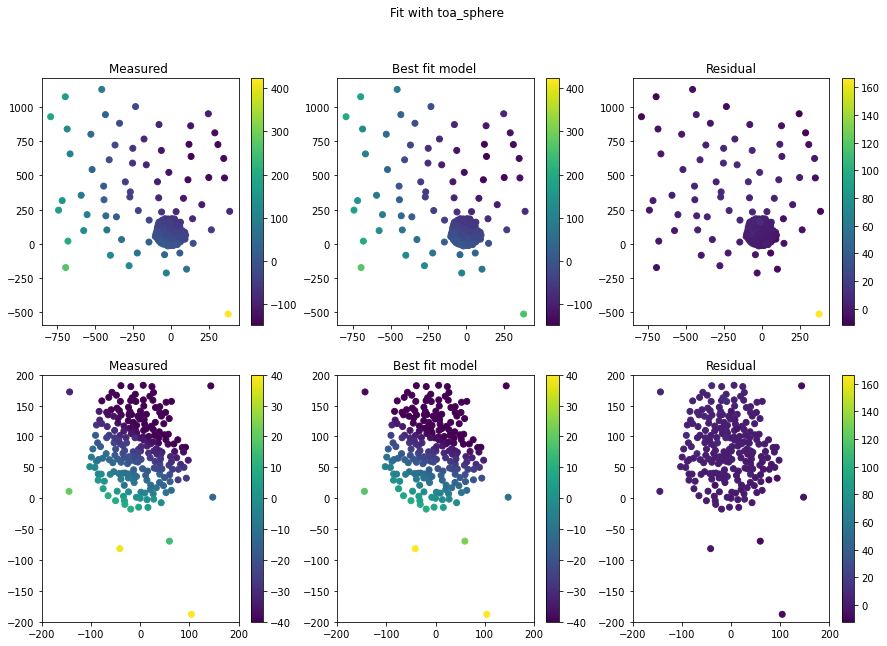

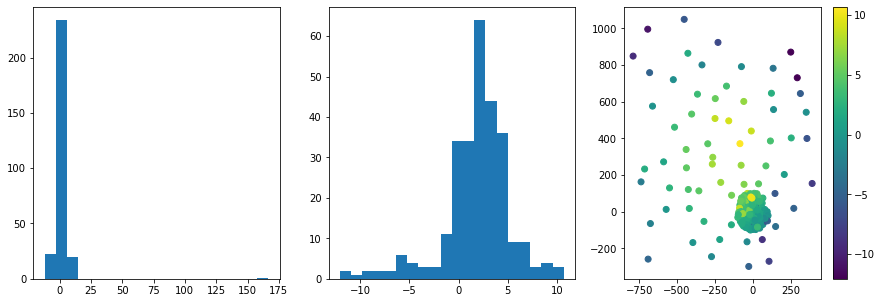

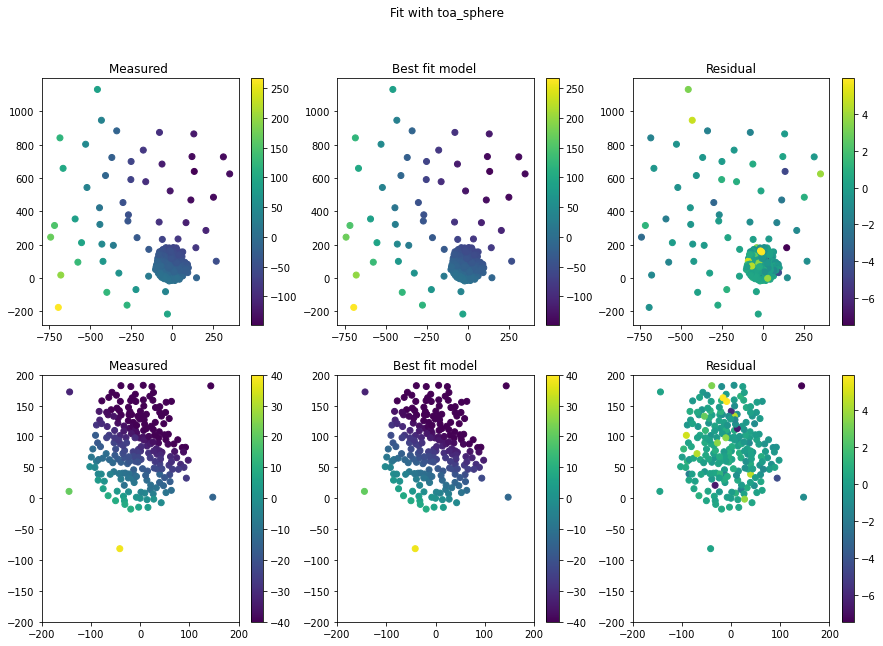

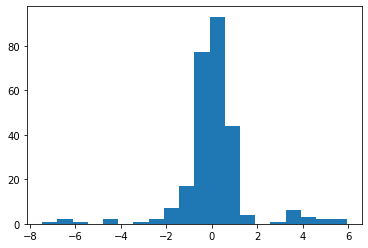

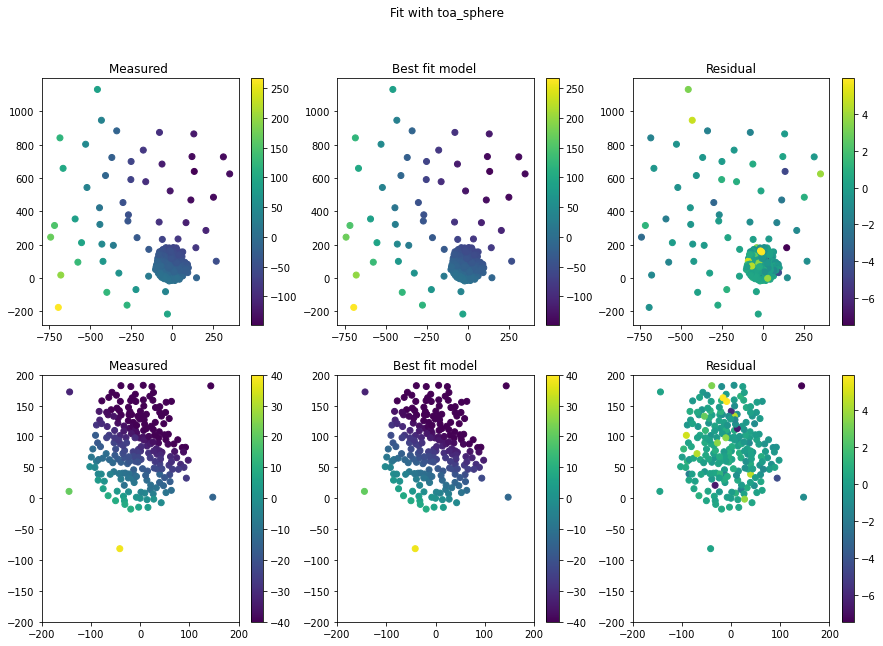

...

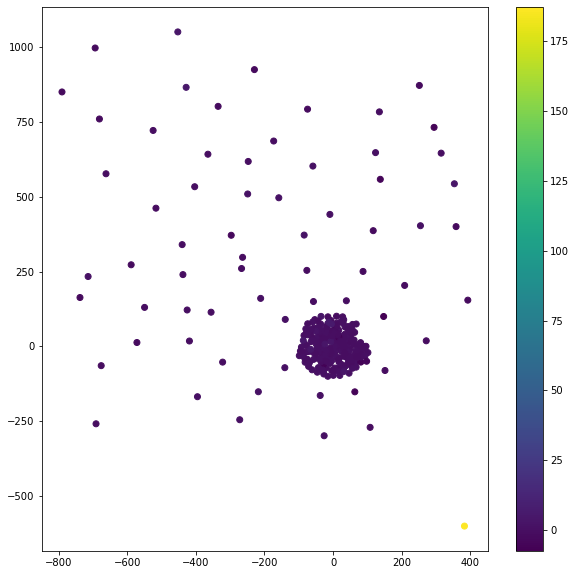

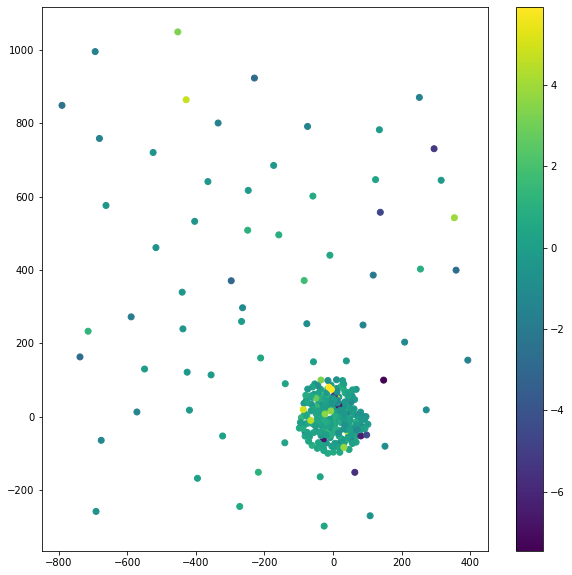

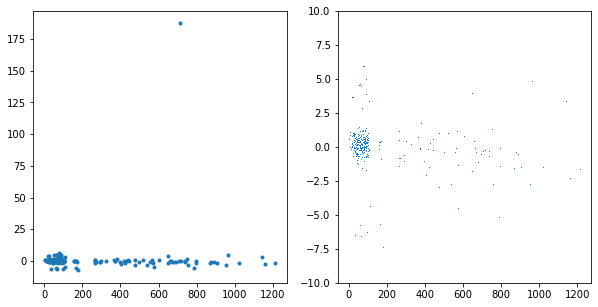

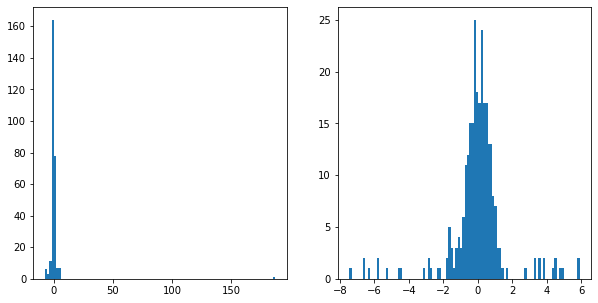

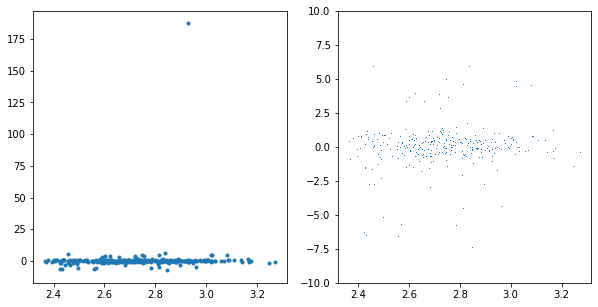

In [175]:

popt,pcov,residual,[x_ref,y_ref,z_ref,t_ref]=simple_direction_fit(useforfit,plot=True,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),weightbysnr=False,usecolumn='tpeak_calibrated')
plt.figure(figsize=(15,5))
plt.subplot(131)
plt.hist(residual,20)

plt.subplot(132)
plt.hist(residual[residual<50],20)

plt.subplot(133)
plt.scatter(useforfit['x'][residual<50],useforfit['y'][residual<50],c=residual[residual<50])
plt.colorbar()

current_ant_summary_array=useforfit
outlier_limit=5
#calculate outliers
antpols=np.asarray([current_ant_summary_array['antname'][i]+current_ant_summary_array['pol'][i] for i in range(len(residual))])
residual_med=np.median(residual)
abs_dev_from_med=np.abs(residual-residual_med)
residual_MAD=np.median(abs_dev_from_med)
outliers=antpols[abs_dev_from_med>outlier_limit*residual_MAD]

print(residual_med,residual_MAD)
print(outliers)

print(len(current_ant_summary_array))
current_ant_summary_array=flag_antennas(current_ant_summary_array,1e9, 0,-1000,1000,1000,outliers)[0]
print(len(current_ant_summary_array))

popt,pcov,residual,[x_ref,y_ref,z_ref,t_ref]=simple_direction_fit(current_ant_summary_array,plot=True,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),weightbysnr=False,usecolumn='tpeak_calibrated')

plt.figure()
plt.hist(residual,20)

outlier_limit=5
#calculate outliers
antpols=np.asarray([current_ant_summary_array['antname'][i]+current_ant_summary_array['pol'][i] for i in range(len(residual))])
residual_med=np.median(residual)
abs_dev_from_med=np.abs(residual-residual_med)
residual_MAD=np.median(abs_dev_from_med)
outliers=antpols[abs_dev_from_med>outlier_limit*residual_MAD]

print(residual_med,residual_MAD,np.mean(residual),np.std(residual))
print(outliers)

popt,pcov,residual,[x_ref,y_ref,z_ref,t_ref]=simple_direction_fit(current_ant_summary_array,plot=True,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),weightbysnr=False,usecolumn='tpeak_calibrated')

outlier_limit=5
#calculate outliers
antpols=np.asarray([current_ant_summary_array['antname'][i]+current_ant_summary_array['pol'][i] for i in range(len(residual))])
residual_med=np.median(residual)
abs_dev_from_med=np.abs(residual-residual_med)
residual_MAD=np.median(abs_dev_from_med)
outliers=antpols[abs_dev_from_med>outlier_limit*residual_MAD]

print(residual_med,residual_MAD,np.mean(residual),np.std(residual))
print(outliers)

plt.figure()
plt.hist(residual)

x=useforfit['x'] - x_ref
y=useforfit['y'] - y_ref
z=useforfit['z'] - z_ref
t=useforfit['tpeak_calibrated'] - t_ref
ant_coords=np.zeros((3,len(x)))
ant_coords[0,:]=x
ant_coords[1,:]=y
ant_coords[2,:]=z

best_model_toas=toa_sphere(ant_coords,*popt)
residual=t-best_model_toas

plt.figure(figsize=(10,10))
plt.scatter(useforfit['x'],useforfit['y'],c=residual)
plt.colorbar()

plt.figure(figsize=(10,10))
cut=np.abs(residual)<100
plt.scatter(useforfit['x'][cut],useforfit['y'][cut],c=residual[cut])
plt.colorbar()

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(np.sqrt(useforfit['distance']),residual,'.')

plt.subplot(122)
plt.plot(np.sqrt(useforfit['distance']),residual,',')
plt.ylim(-10,10)
plt.show()

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.hist(residual,100)

plt.subplot(122)
plt.hist(residual[residual<100],100)

plt.show()

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(np.sqrt(useforfit['snr']),residual,'.')

plt.subplot(122)
plt.plot(np.sqrt(useforfit['snr']),residual,',')
plt.ylim(-10,10)

plt.show()

## Robust, spherical fit without the correction 

Reference antenna LWA-127


/opt/devel/pipeline/envs/deployment/lib/python3.6/site-packages/numpy/core/fromnumeric.py:748: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


0.5532431084672282 0.8694724485481373
['LWA-259A' 'LWA-268A' 'LWA-181A' 'LWA-136A' 'LWA-267A' 'LWA-176A'
 'LWA-266A' 'LWA-161A' 'LWA-269A' 'LWA-273A' 'LWA-271A' 'LWA-243A'
 'LWA-282A' 'LWA-281A' 'LWA-278A' 'LWA-285A' 'LWA-198A' 'LWA-308A'
 'LWA-307A' 'LWA-310A' 'LWA-313A' 'LWA-312A' 'LWA-311A' 'LWA-314A'
 'LWA-326A' 'LWA-322A' 'LWA-333A' 'LWA-359A' 'LWA-169A' 'LWA-257A'
 'LWA-324A' 'LWA-270A' 'LWA-262A' 'LWA-265A' 'LWA-253A' 'LWA-284A'
 'LWA-264A' 'LWA-330A' 'LWA-345A' 'LWA-327A' 'LWA-295A' 'LWA-329A'
 'LWA-304A' 'LWA-226A' 'LWA-321A' 'LWA-328A' 'LWA-293A' 'LWA-305A'
 'LWA-332A' 'LWA-361A' 'LWA-358A' 'LWA-340A' 'LWA-279A' 'LWA-334A'
 'LWA-254A' 'LWA-274A' 'LWA-318A' 'LWA-317A' 'LWA-338A' 'LWA-343A'
 'LWA-337A' 'LWA-350A' 'LWA-346A' 'LWA-336A' 'LWA-362A' 'LWA-344A'
 'LWA-323A' 'LWA-132A' 'LWA-252A' 'LWA-134A' 'LWA-294A']
277
206
Reference antenna LWA-127
0.19601377298679523 0.5880486145157913 0.23816804057385982 1.0374774883395983
['LWA-141A' 'LWA-044A' 'LWA-256A' 'LWA-102A' 'LWA-240A']

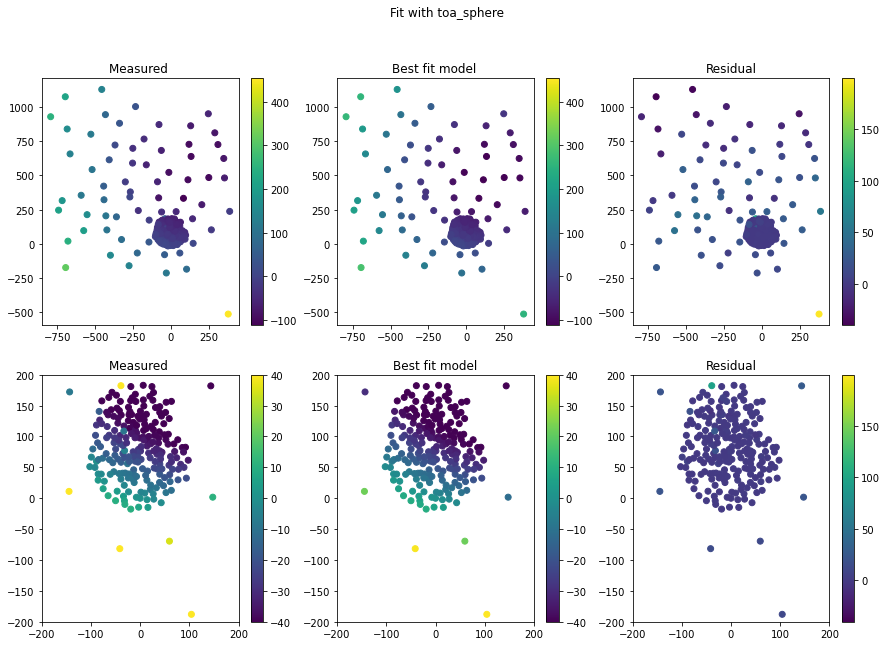

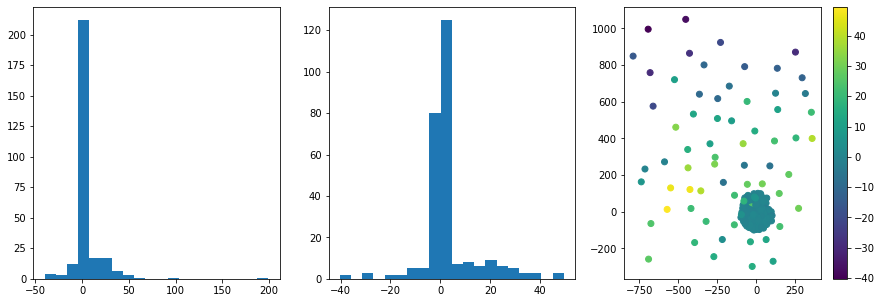

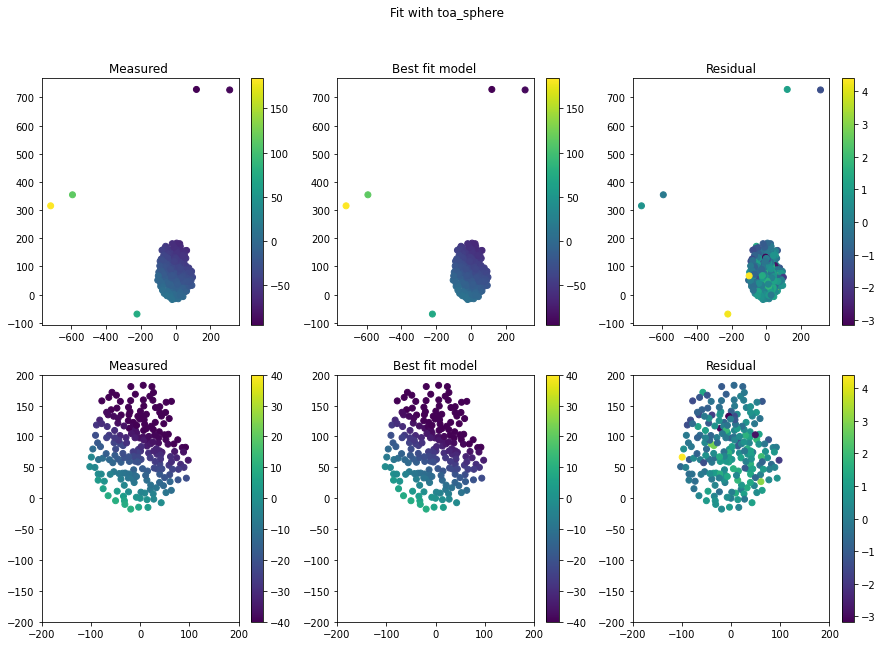

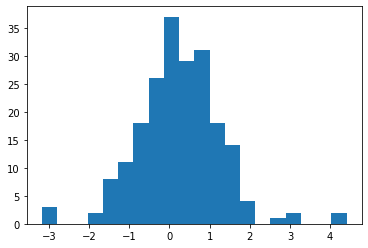

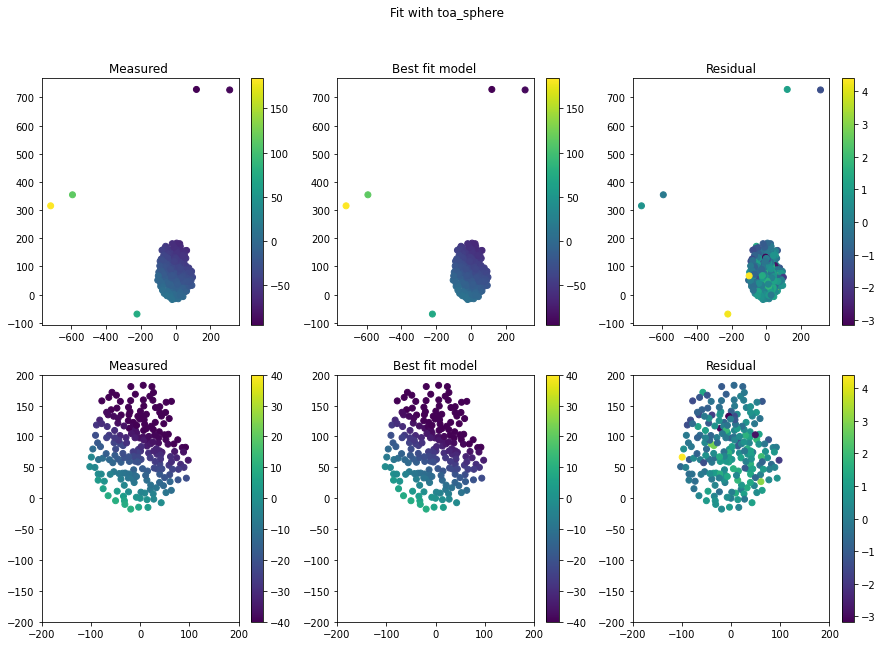

...

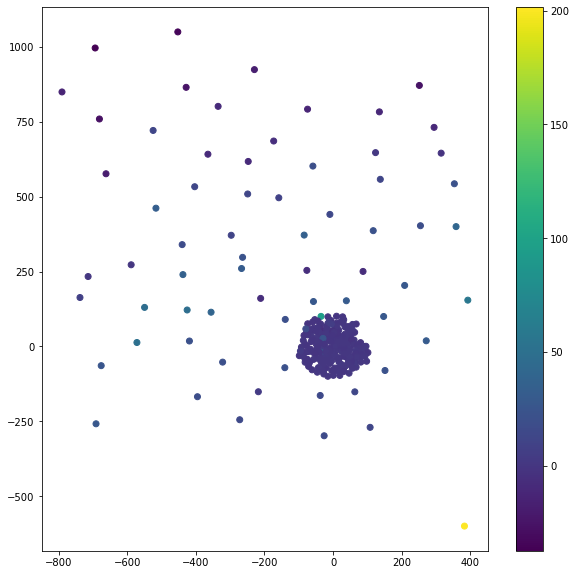

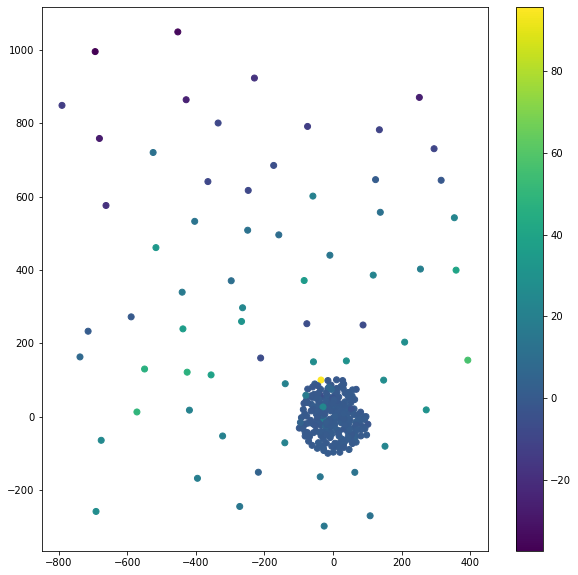

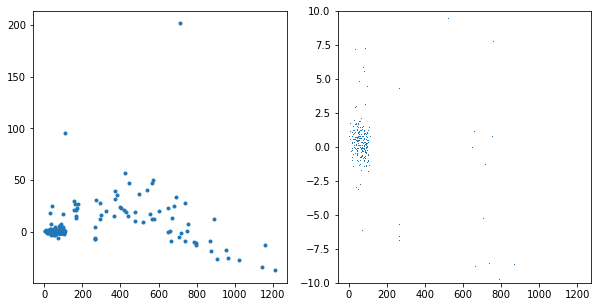

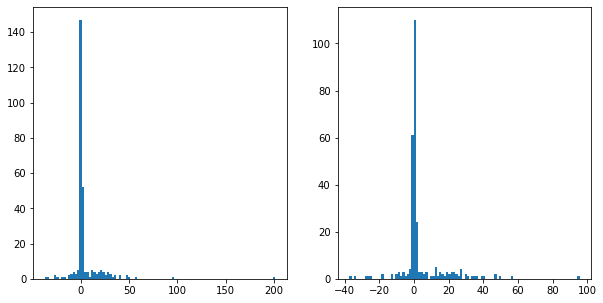

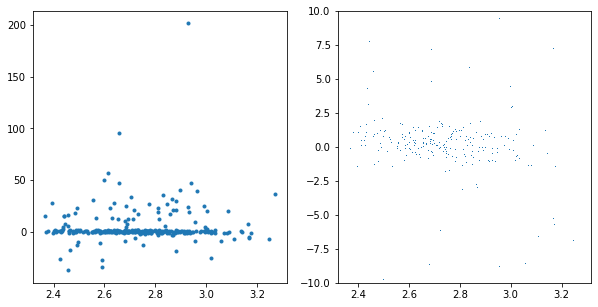

In [176]:

popt,pcov,residual,[x_ref,y_ref,z_ref,t_ref]=simple_direction_fit(useforfit,plot=True,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),weightbysnr=False,usecolumn='tpeak_rel')
plt.figure(figsize=(15,5))
plt.subplot(131)
plt.hist(residual,20)

plt.subplot(132)
plt.hist(residual[residual<50],20)

plt.subplot(133)
plt.scatter(useforfit['x'][residual<50],useforfit['y'][residual<50],c=residual[residual<50])
plt.colorbar()

current_ant_summary_array=useforfit
outlier_limit=5
#calculate outliers
antpols=np.asarray([current_ant_summary_array['antname'][i]+current_ant_summary_array['pol'][i] for i in range(len(residual))])
residual_med=np.median(residual)
abs_dev_from_med=np.abs(residual-residual_med)
residual_MAD=np.median(abs_dev_from_med)
outliers=antpols[abs_dev_from_med>outlier_limit*residual_MAD]

print(residual_med,residual_MAD)
print(outliers)

print(len(current_ant_summary_array))
current_ant_summary_array=flag_antennas(current_ant_summary_array,1e9, 0,-1000,1000,1000,outliers)[0]
print(len(current_ant_summary_array))

popt,pcov,residual,[x_ref,y_ref,z_ref,t_ref]=simple_direction_fit(current_ant_summary_array,plot=True,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),weightbysnr=False,usecolumn='tpeak_rel')

plt.figure()
plt.hist(residual,20)

outlier_limit=5
#calculate outliers
antpols=np.asarray([current_ant_summary_array['antname'][i]+current_ant_summary_array['pol'][i] for i in range(len(residual))])
residual_med=np.median(residual)
abs_dev_from_med=np.abs(residual-residual_med)
residual_MAD=np.median(abs_dev_from_med)
outliers=antpols[abs_dev_from_med>outlier_limit*residual_MAD]

print(residual_med,residual_MAD,np.mean(residual),np.std(residual))
print(outliers)

popt,pcov,residual,[x_ref,y_ref,z_ref,t_ref]=simple_direction_fit(current_ant_summary_array,plot=True,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),weightbysnr=False,usecolumn='tpeak_rel')

outlier_limit=5
#calculate outliers
antpols=np.asarray([current_ant_summary_array['antname'][i]+current_ant_summary_array['pol'][i] for i in range(len(residual))])
residual_med=np.median(residual)
abs_dev_from_med=np.abs(residual-residual_med)
residual_MAD=np.median(abs_dev_from_med)
outliers=antpols[abs_dev_from_med>outlier_limit*residual_MAD]

print(residual_med,residual_MAD,np.mean(residual),np.std(residual))
print(outliers)

plt.figure()
plt.hist(residual)

x=useforfit['x'] - x_ref
y=useforfit['y'] - y_ref
z=useforfit['z'] - z_ref
t=useforfit['tpeak_rel'] - t_ref
ant_coords=np.zeros((3,len(x)))
ant_coords[0,:]=x
ant_coords[1,:]=y
ant_coords[2,:]=z

best_model_toas=toa_sphere(ant_coords,*popt)
residual=t-best_model_toas

plt.figure(figsize=(10,10))
plt.scatter(useforfit['x'],useforfit['y'],c=residual)
plt.colorbar()

plt.figure(figsize=(10,10))
cut=np.abs(residual)<100
plt.scatter(useforfit['x'][cut],useforfit['y'][cut],c=residual[cut])
plt.colorbar()

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(np.sqrt(useforfit['distance']),residual,'.')

plt.subplot(122)
plt.plot(np.sqrt(useforfit['distance']),residual,',')
plt.ylim(-10,10)
plt.show()

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.hist(residual,100)

plt.subplot(122)
plt.hist(residual[residual<100],100)

plt.show()

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.plot(np.sqrt(useforfit['snr']),residual,'.')

plt.subplot(122)
plt.plot(np.sqrt(useforfit['snr']),residual,',')
plt.ylim(-10,10)

plt.show()

## Check performance of robust fit function
I have modified this function to take an argument to determine whether to use the corrected or original arrival times.

Reference antenna LWA-127
iteration:  0  rms residual:  10.7349826135418  n outliers:  12
popt:  [ 40.49531492  15.97560481 950.1669738 ]
pcov:  [[ 3.04941563e-01 -1.24834670e-01 -7.92065822e+00]
 [-1.24834670e-01  4.33915626e-01  7.62732285e+00]
 [-7.92065822e+00  7.62732285e+00  3.02165908e+02]]
Reference antenna LWA-127
iteration:  1  rms residual:  1.5002852036381864  n outliers:  22
popt:  [  38.09004833   19.09929123 1049.62211671]
pcov:  [[ 6.77727639e-03 -3.71898593e-03 -2.41652857e-01]
 [-3.71898593e-03  1.43902014e-02  3.42902582e-01]
 [-2.41652857e-01  3.42902582e-01  1.41764973e+01]]
Reference antenna LWA-127
iteration:  2  rms residual:  0.6255468082913996  n outliers:  1
popt:  [  38.04709309   19.18163408 1054.94810163]
pcov:  [[ 1.40243261e-03 -7.87995273e-04 -5.33610482e-02]
 [-7.87995273e-04  3.10700467e-03  7.98727535e-02]
 [-5.33610482e-02  7.98727535e-02  3.45076225e+00]]


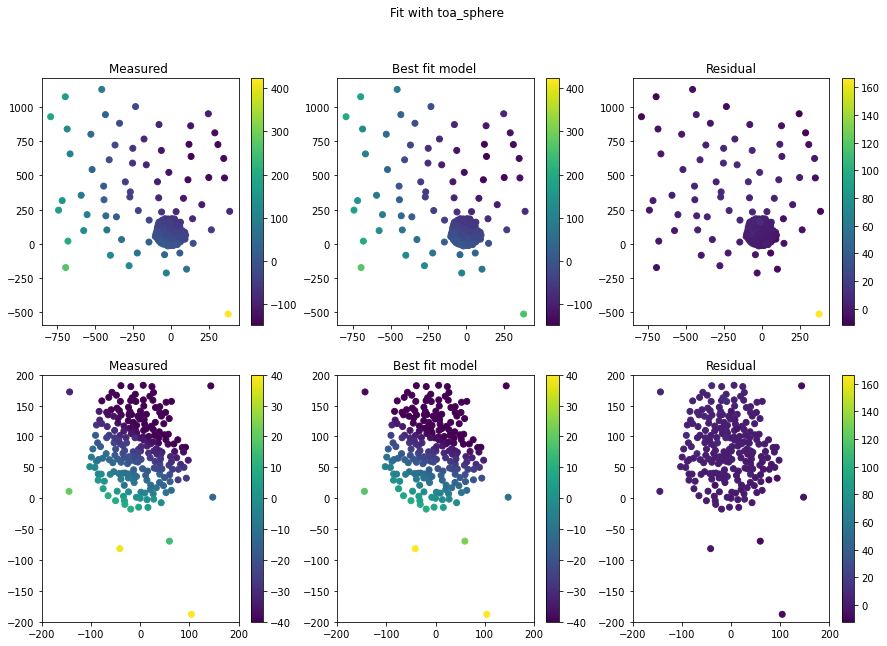

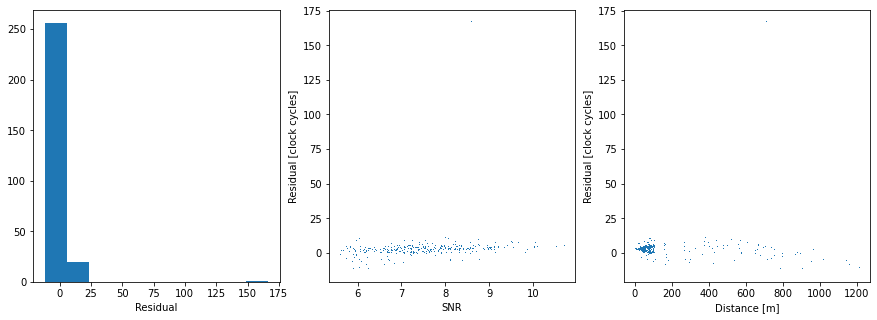

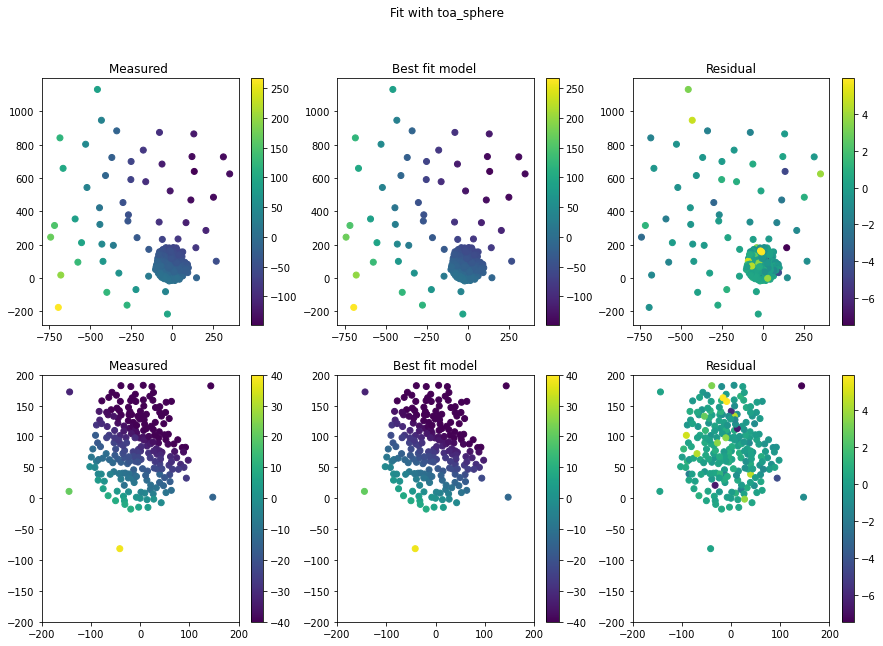

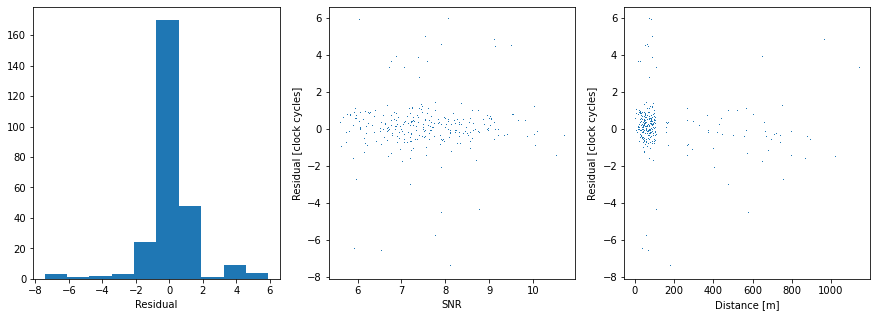

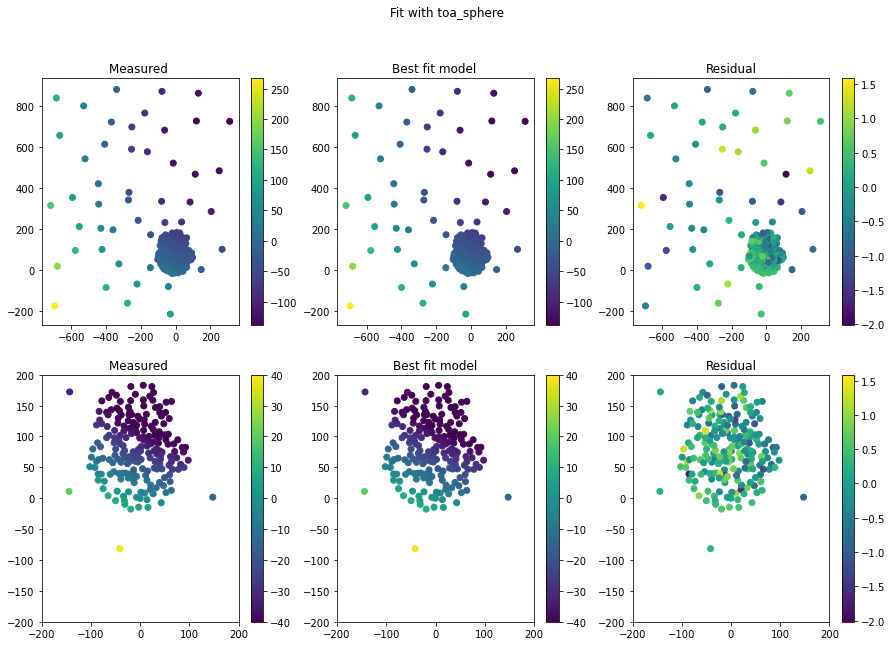

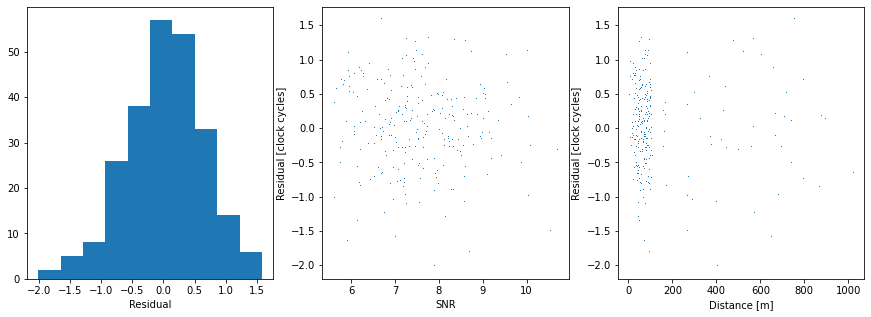

In [177]:
popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(np.ma.getdata(useforfit),3,5,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')


Next, I repeat with an outlier threshold of 4 that matches the config file I've been using for data processing.  There's a bit more flagging but the direction and distance parameters for the direction result end up matching very closely.

Reference antenna LWA-127
iteration:  0  rms residual:  10.7349826135418  n outliers:  25
popt:  [ 40.49531492  15.97560481 950.1669738 ]
pcov:  [[ 3.04941563e-01 -1.24834670e-01 -7.92065822e+00]
 [-1.24834670e-01  4.33915626e-01  7.62732285e+00]
 [-7.92065822e+00  7.62732285e+00  3.02165908e+02]]
Reference antenna LWA-127
iteration:  1  rms residual:  1.2461599943415227  n outliers:  20
popt:  [  38.09314094   19.0528485  1049.63634738]
pcov:  [[ 5.82035471e-03 -3.18573590e-03 -2.19557468e-01]
 [-3.18573590e-03  1.20195436e-02  3.09168705e-01]
 [-2.19557468e-01  3.09168705e-01  1.36187137e+01]]
Reference antenna LWA-127
iteration:  2  rms residual:  0.5834817347348241  n outliers:  0
popt:  [  38.06069523   19.20390157 1054.57156342]
pcov:  [[ 1.51522053e-03 -7.14434628e-04 -5.62120155e-02]
 [-7.14434628e-04  3.32799209e-03  8.52254719e-02]
 [-5.62120155e-02  8.52254719e-02  3.77386943e+00]]


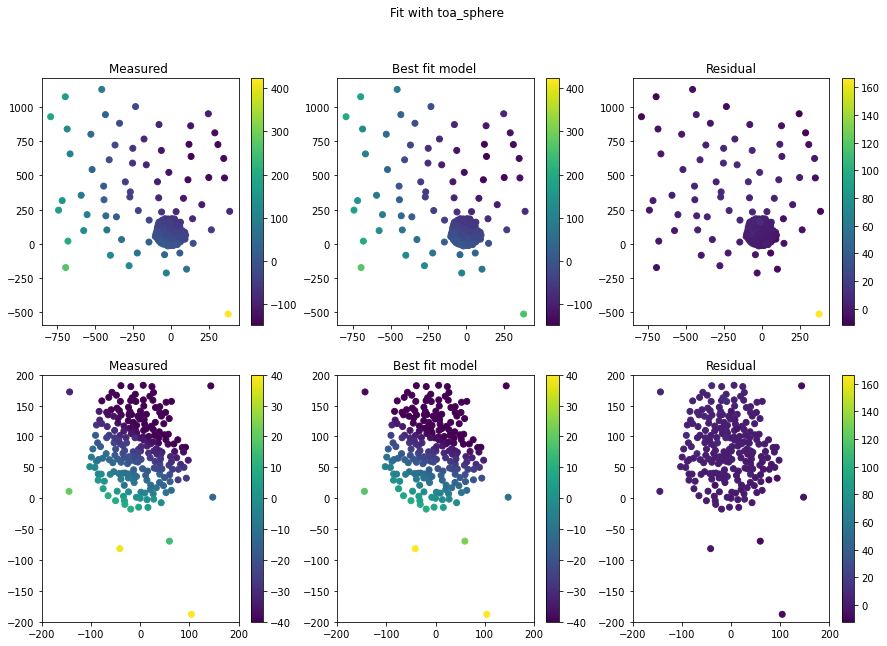

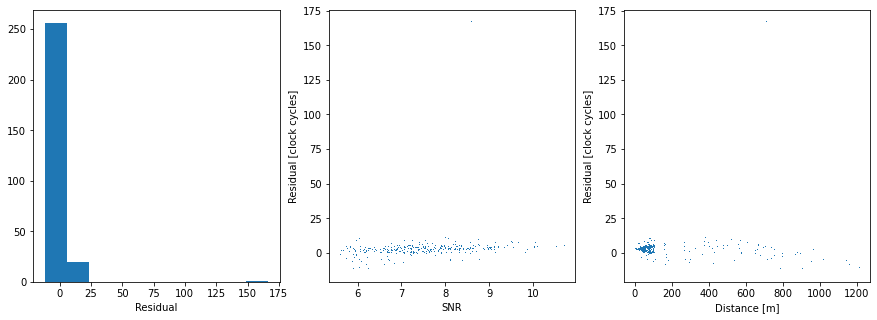

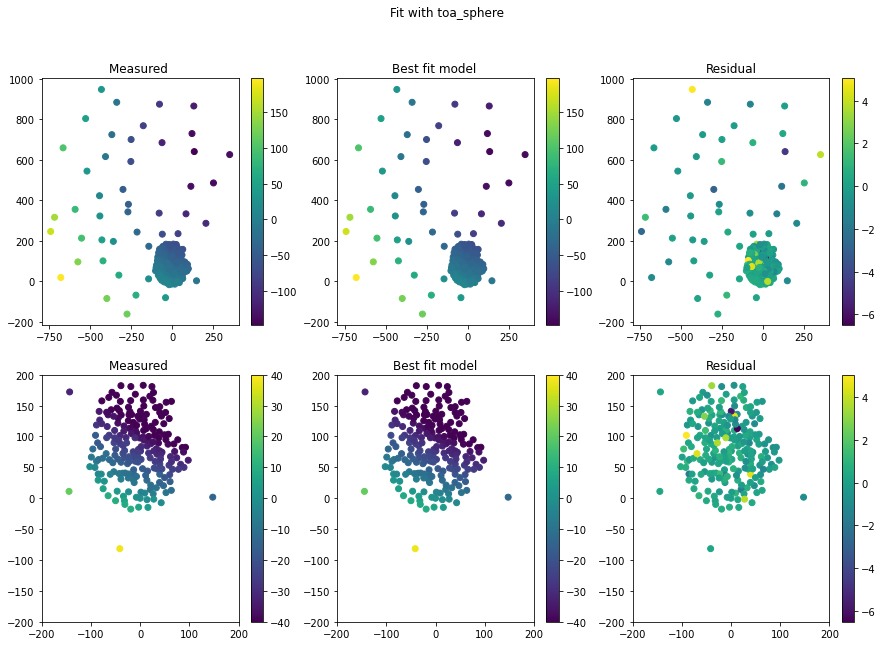

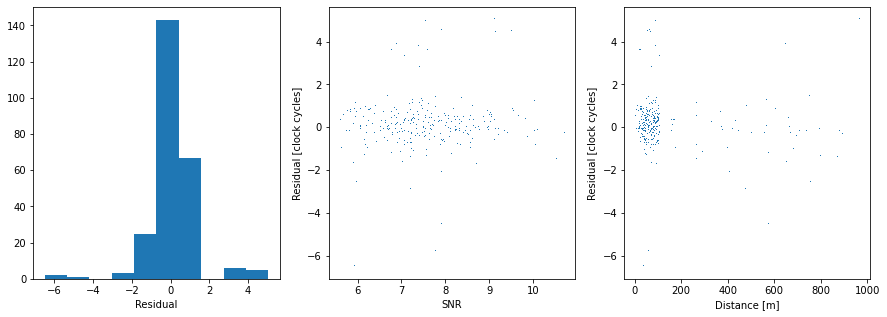

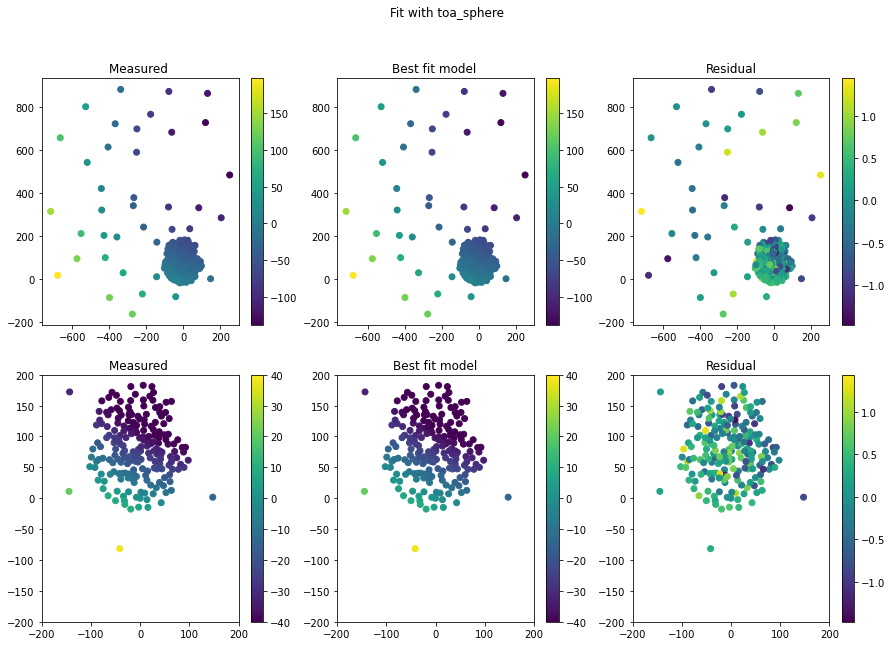

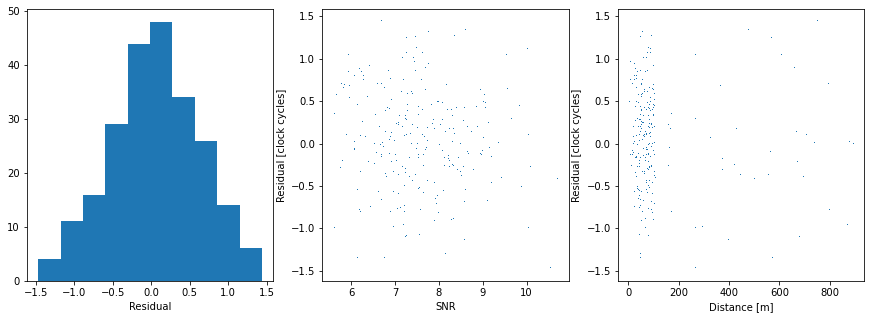

In [178]:
popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(np.ma.getdata(useforfit),3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')


# Make a function for the steps of selecting the bright antennas and applying the calibration
I test this first for the event I've been using, and then other events.

In [179]:
def apply_delay_cal(event, caltable,minsnr,signflip=True):
    #This function returns an event summary array that has had a delay calibration applied to antennas of the dominant polarization, generating two new columns
    #The original arrival time columns are not changed.
    #The new column 'delay_cal' contains the delays assigned to each antenna from the input calibration array.
    #The new column 'tpeak_calibrated' contains the calibrated event arrival times. tpeak_calibrated=tpeak_rel - delay_cal
    #If signflip=True, the delays in the input calibration array are multiplied by -1, which is needed because relative delays between antennas can be defined with two different conventions
    #The output event summary array will only contain rows for antennas that meet a minimum snr cutoff and have delay solutions present in the calibration array.
    #caltable is a numpy array with the calibration solutions in microseconds where caltable[0,:] are the XX delays and caltable[1,:] are the YY, and entries are ordered by the antenna's correlator number.
    #event is the input event summary array
    #minsnr is the minimum signal to noise ratio to use

    #select the antennas with an snr above the cutoff snr
    bright=event[event['snr']>minsnr]
    brightpolA=bright[bright['pol']=='A']
    brightpolB=bright[bright['pol']=='B']

    #determine which polarization is stronger
    if len(brightpolA)>len(brightpolB):
        output=brightpolA
        strongpol='A'
    else:
        output=brightpolB
        strongpol='B'

    #XX is A pol, YY is B pol
    if strongpol=='A':
        corrdelays=caltable[0,:]
    if strongpol=='B':
        corrdelays=caltable[1,:]

    #make a list of the correlator delays in the order that the antennas appear in my event data array
    if signflip==True:
        sign=-1
    else:
        sign=1
    corrdelays_reordered=np.asarray([corrdelays[mapping.antname_to_correlator(a)] for a in output['antname']])
    corrdelays_sign=sign*fs*corrdelays_reordered #change to the sign convention that I use for delays and convert to clock cycles

    #Add the delays and a delay-calibrated column to the event data array
    t_corrected=output['tpeak_rel']-corrdelays_sign
    output=rfn.append_fields(output,'delay_cal',data=corrdelays_sign,dtypes=np.float64)
    output=rfn.append_fields(output,'tpeak_calibrated',data=t_corrected,dtypes=np.float64)

    #keep only the ones that have a delay solution
    output=np.ma.getdata(output[output['tpeak_calibrated']>=0])
    return output

Reference antenna LWA-127
iteration:  0  rms residual:  10.7349826135418  n outliers:  25
popt:  [ 40.49531492  15.97560481 950.1669738 ]
pcov:  [[ 3.04941563e-01 -1.24834670e-01 -7.92065822e+00]
 [-1.24834670e-01  4.33915626e-01  7.62732285e+00]
 [-7.92065822e+00  7.62732285e+00  3.02165908e+02]]
Reference antenna LWA-127
iteration:  1  rms residual:  1.2461599943415227  n outliers:  20
popt:  [  38.09314094   19.0528485  1049.63634738]
pcov:  [[ 5.82035471e-03 -3.18573590e-03 -2.19557468e-01]
 [-3.18573590e-03  1.20195436e-02  3.09168705e-01]
 [-2.19557468e-01  3.09168705e-01  1.36187137e+01]]
Reference antenna LWA-127
iteration:  2  rms residual:  0.5834817347348241  n outliers:  0
popt:  [  38.06069523   19.20390157 1054.57156342]
pcov:  [[ 1.51522053e-03 -7.14434628e-04 -5.62120155e-02]
 [-7.14434628e-04  3.32799209e-03  8.52254719e-02]
 [-5.62120155e-02  8.52254719e-02  3.77386943e+00]]


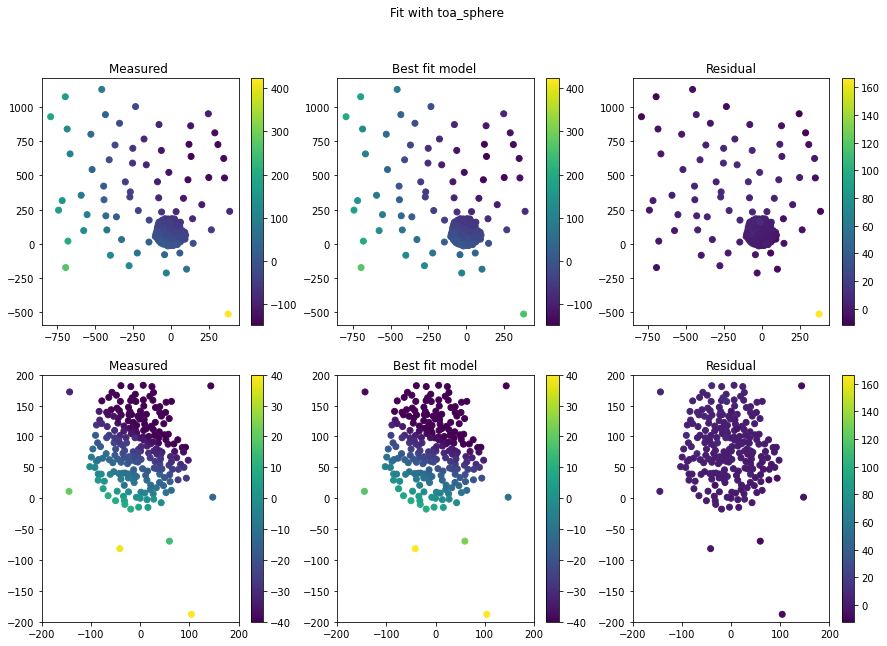

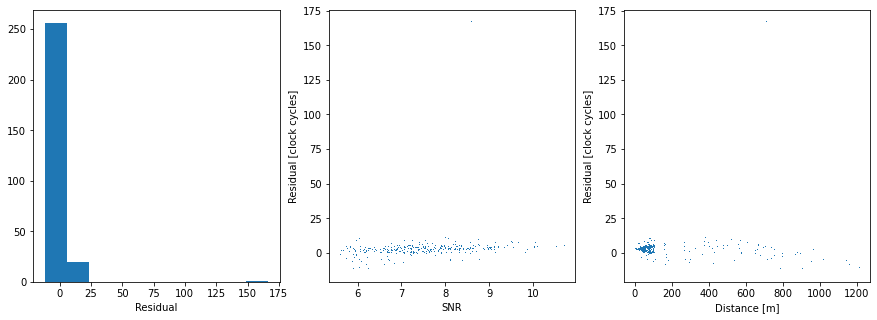

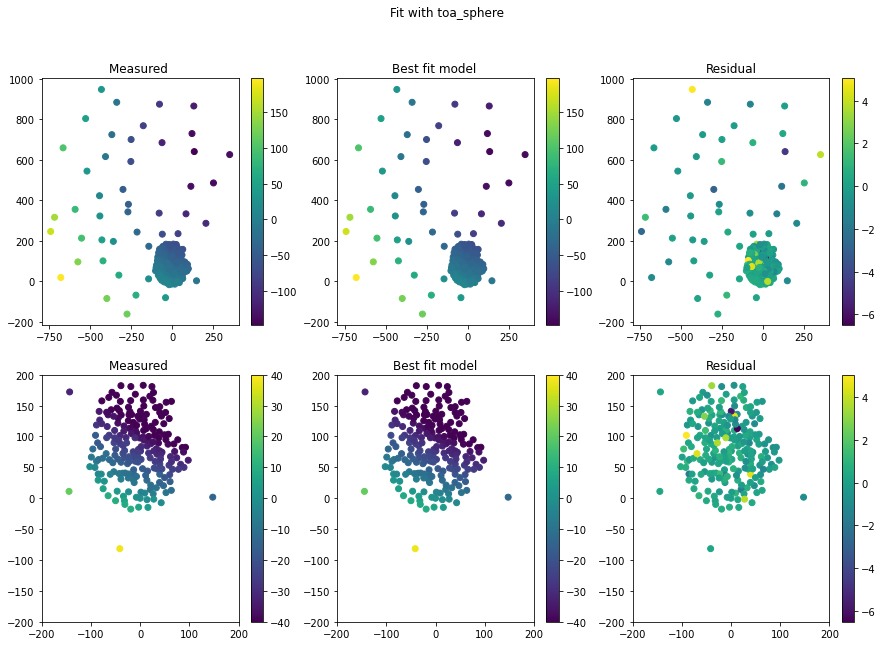

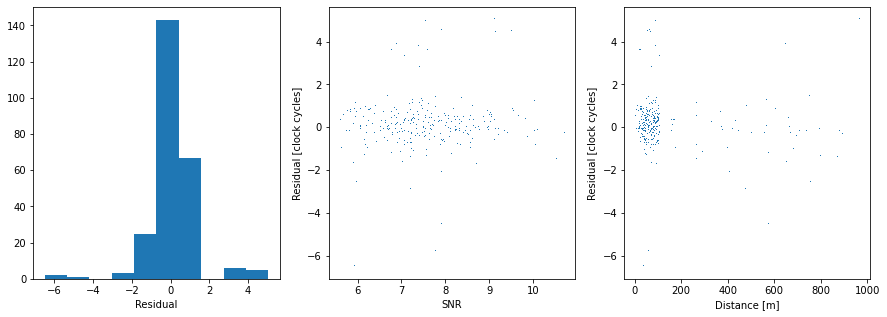

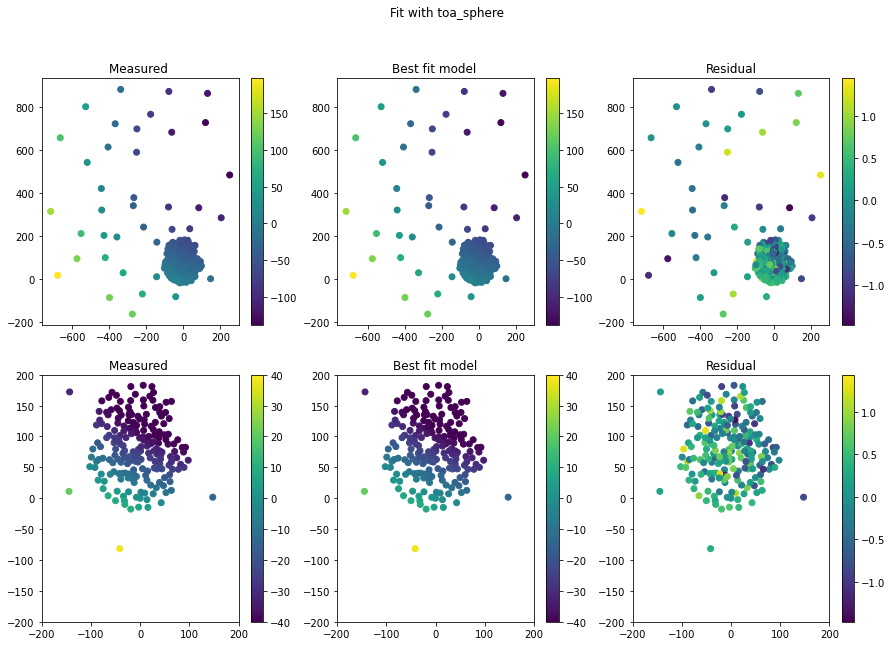

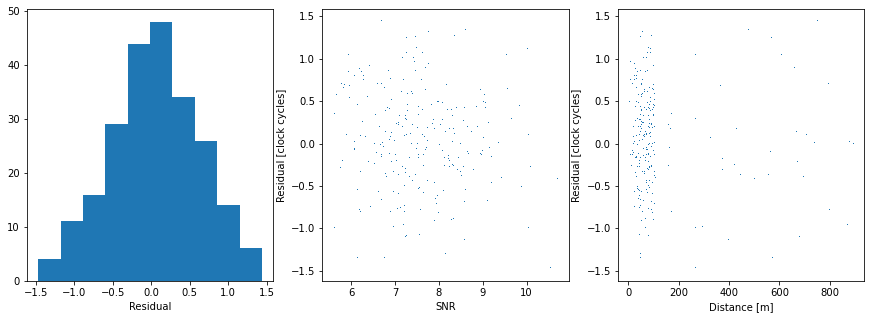

In [180]:
event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')


Next, other events.  Note that the quickanalysis function is still using the old direction fit code for now.

Reference antenna LWA-266
Reference antenna LWA-266
Reference antenna LWA-266
arrival direction azimuth  153.852 +- 60.646 degree
Gaussian semimajor axis azimuth  69.281 +- 33.97 degree
Arrival direction ZA  9.994 +- 0.621 degree
Gaussian aspect ratio  10.37 +- 65.809
Gaussian fit rms residual  0.815
TOA fit rms residual  40.347 rms of residual weighted by snr 40.538159288957274
Reference antenna LWA-266
iteration:  0  rms residual:  178.11029761264524  n outliers:  49
popt:  [1.39924381e+01 3.02961172e+02 1.00000000e+06]
pcov:  [[ 7.63264419e+00 -4.77260080e+00  1.15591756e+08]
 [-4.77260080e+00  2.66356046e+02  5.12870876e+08]
 [ 1.15591756e+08  5.12870876e+08  1.76421375e+16]]
Reference antenna LWA-266
iteration:  1  rms residual:  40.01806361878283  n outliers:  5
popt:  [5.51918269e+00 2.23838046e+02 4.66395883e+05]
pcov:  [[ 5.40668613e+00 -1.15472818e+01 -2.50009763e+07]
 [-1.15472818e+01  1.41700007e+02  1.83806578e+08]
 [-2.50009763e+07  1.83806578e+08  3.35423749e+14]]
Refere

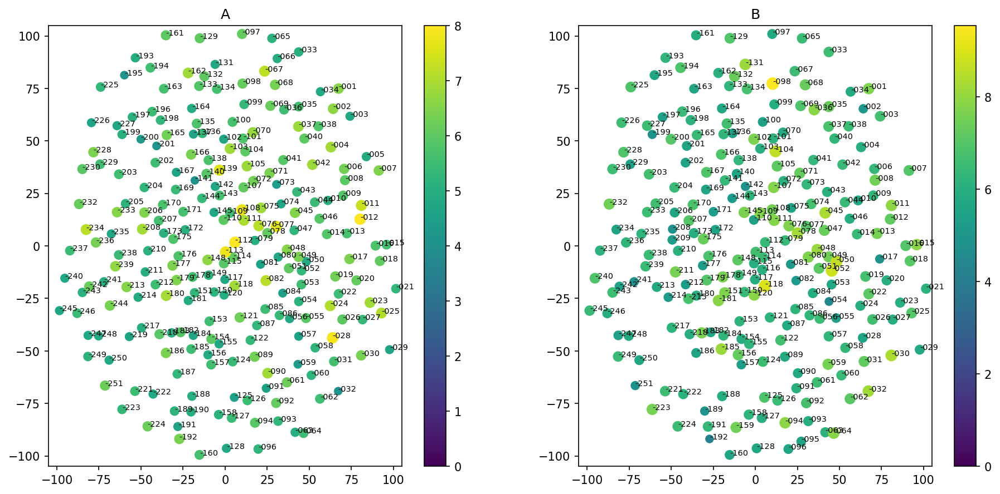

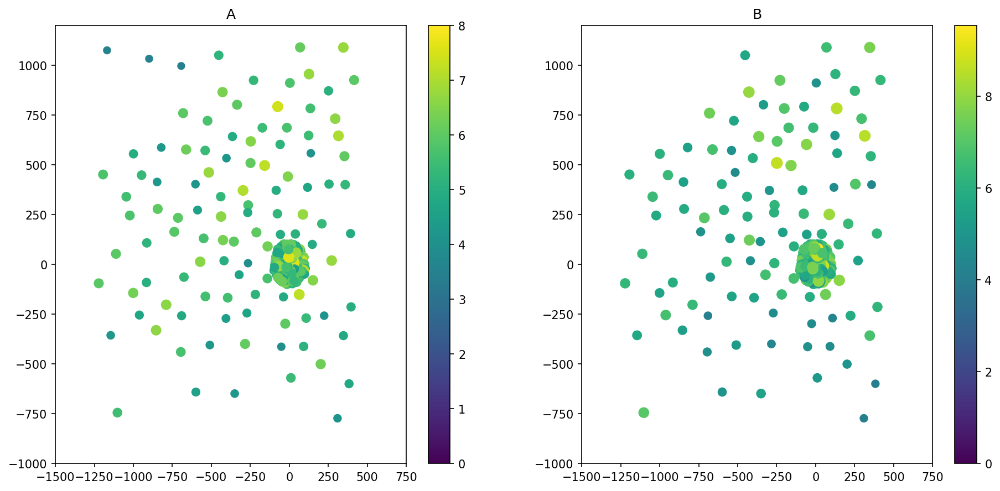

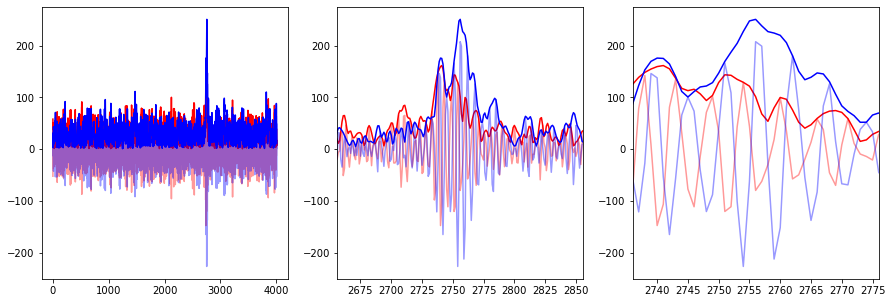

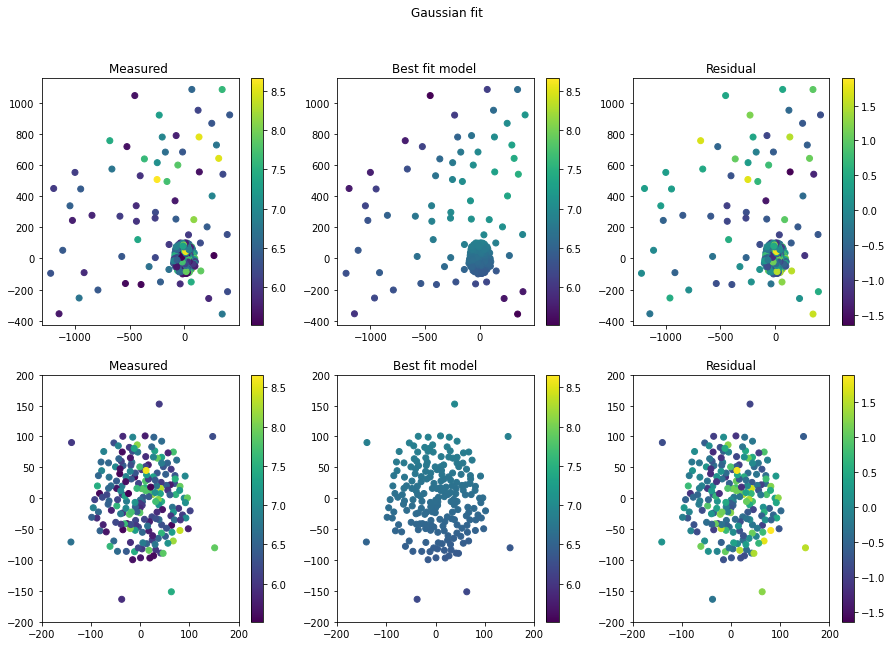

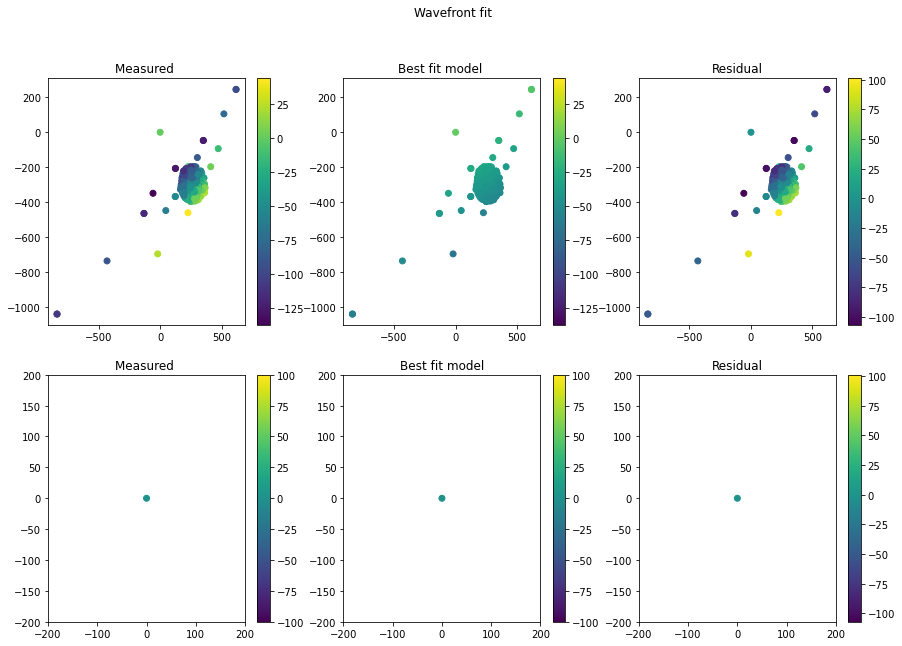

...

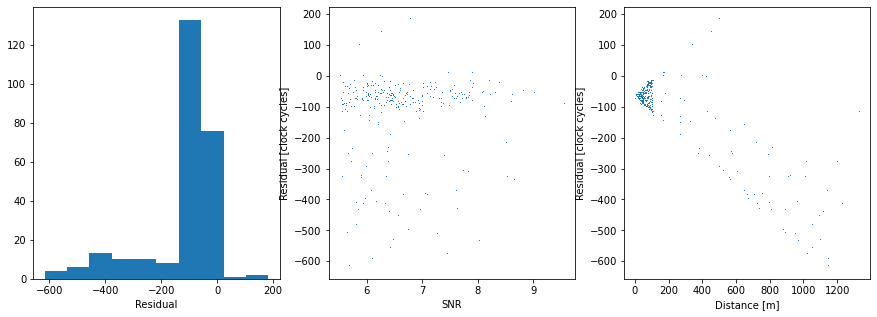

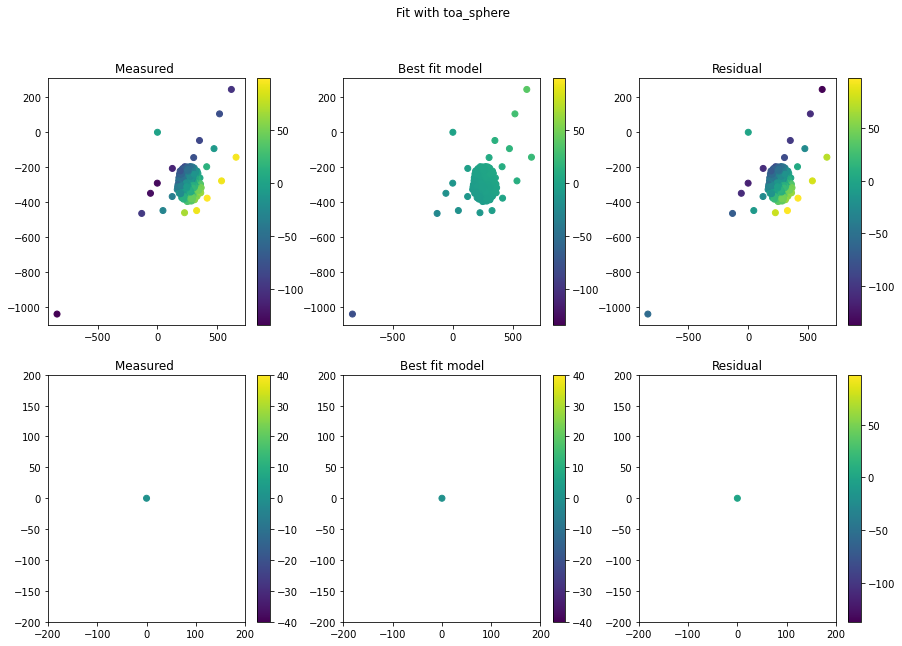

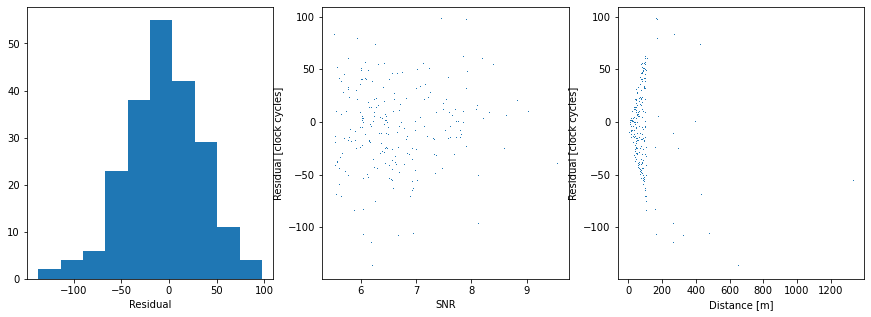

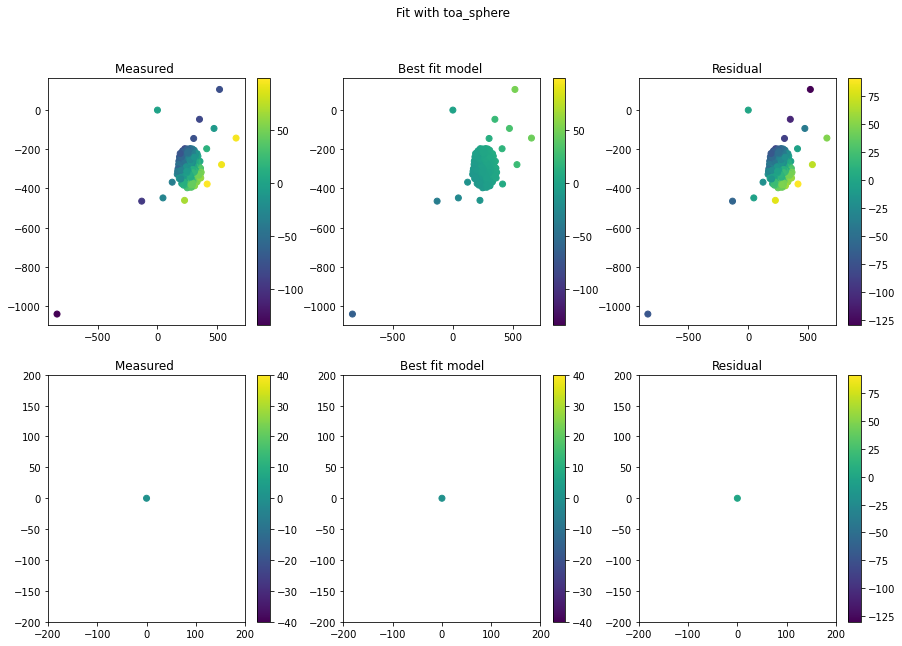

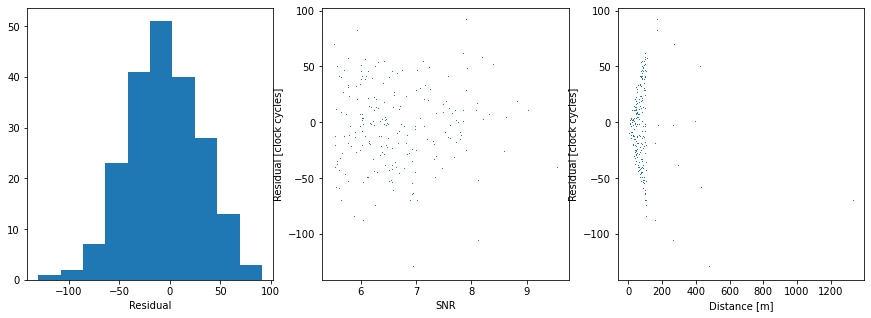

In [181]:
datafile = '/lustre/kplant/2024October23/overnight1729757059.6939254.dat' 
index_in_file=29665
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')


## A high altitude airplane candidate from the same night

Reference antenna LWA-266
Reference antenna LWA-266
Reference antenna LWA-266
arrival direction azimuth  111.688 +- 122.302 degree
Gaussian semimajor axis azimuth  65.864 +- 29.302 degree
Arrival direction ZA  9.186 +- 0.973 degree
Gaussian aspect ratio  16.817 +- 263.854
Gaussian fit rms residual  0.694
TOA fit rms residual  38.335 rms of residual weighted by snr 38.53323500379842
Reference antenna LWA-266
iteration:  0  rms residual:  176.59493086627964  n outliers:  50
popt:  [1.36447659e+01 3.22264296e+02 1.00000000e+06]
pcov:  [[8.70723728e+00 4.43497297e+00 1.72057940e+08]
 [4.43497297e+00 2.74603988e+02 3.52395628e+08]
 [1.72057940e+08 3.52395628e+08 1.88679595e+16]]
Reference antenna LWA-266
iteration:  1  rms residual:  35.61963412223123  n outliers:  2
popt:  [2.79774971e+00 1.53125490e+02 3.93376092e+03]
pcov:  [[ 3.23275402e+00  2.78080697e+01 -2.96900237e+03]
 [ 2.78080697e+01  1.48388326e+03 -1.18604644e+04]
 [-2.96900237e+03 -1.18604644e+04  3.28336945e+06]]
Reference an

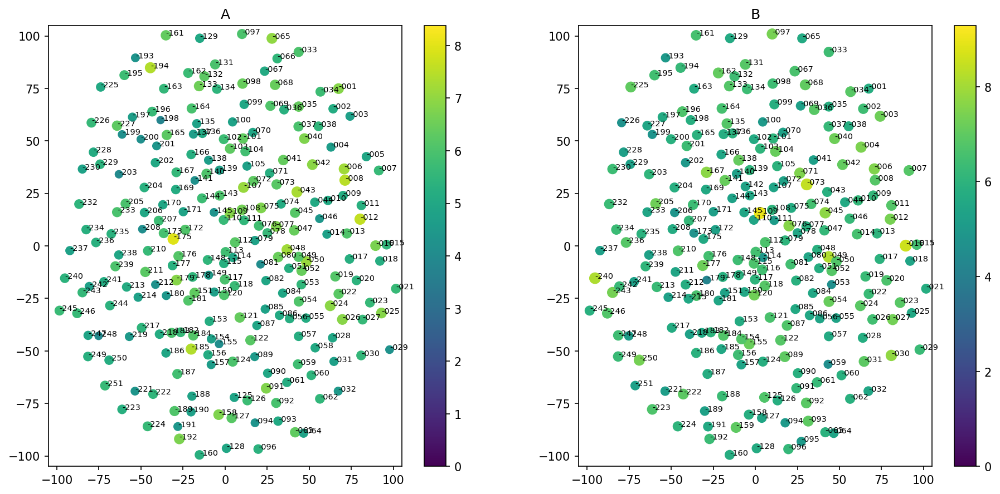

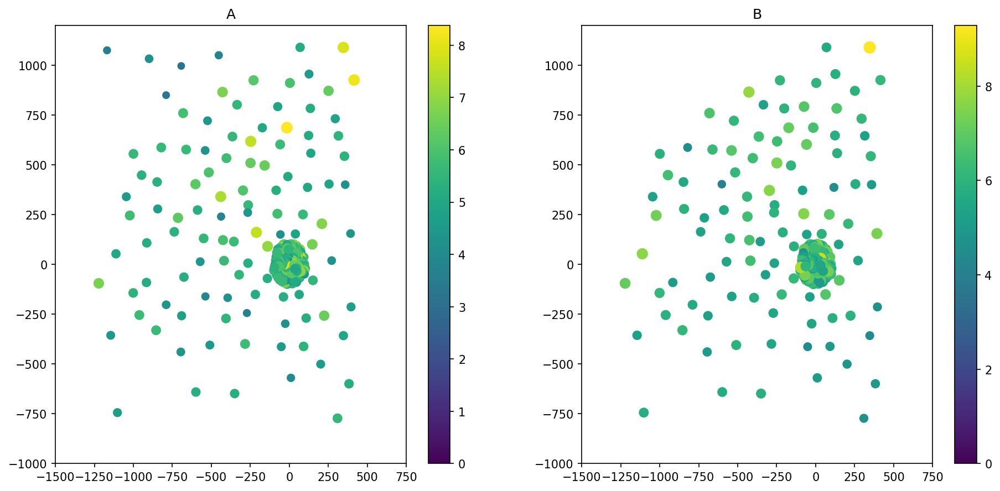

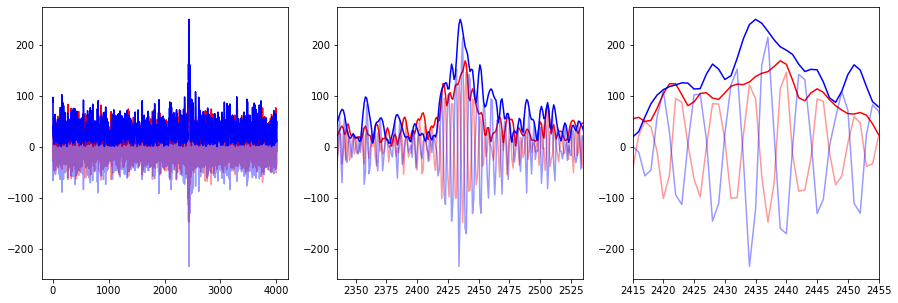

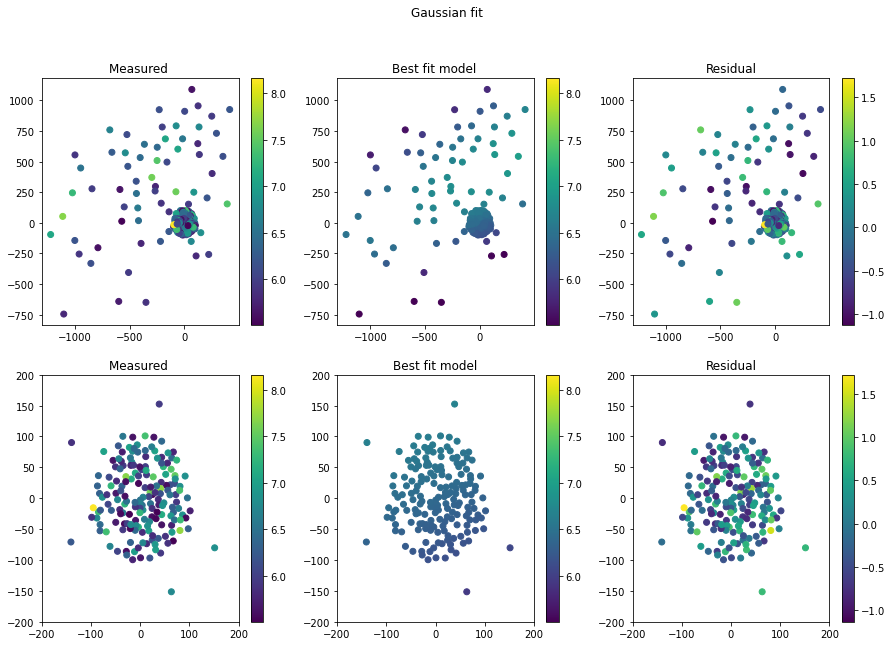

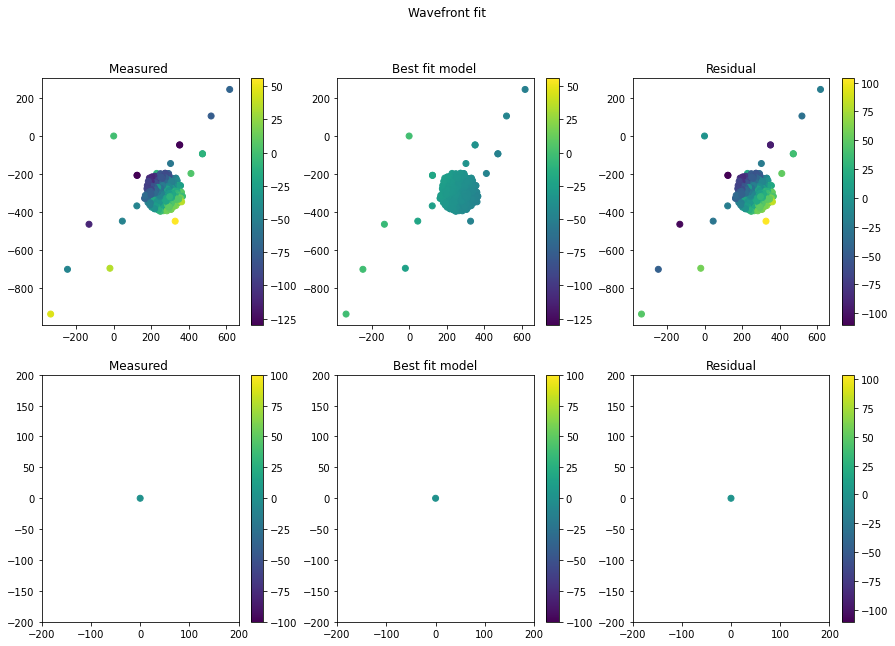

...

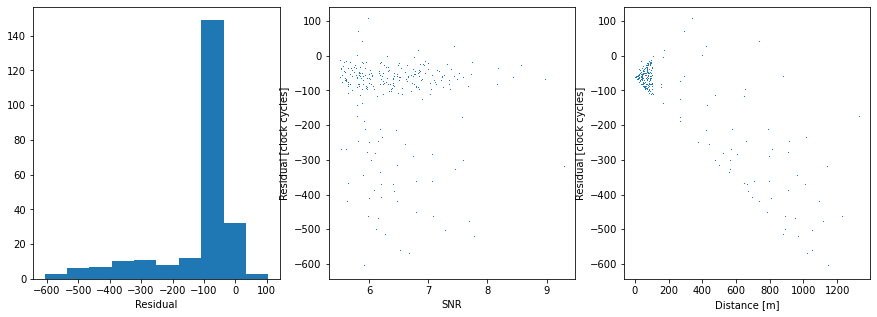

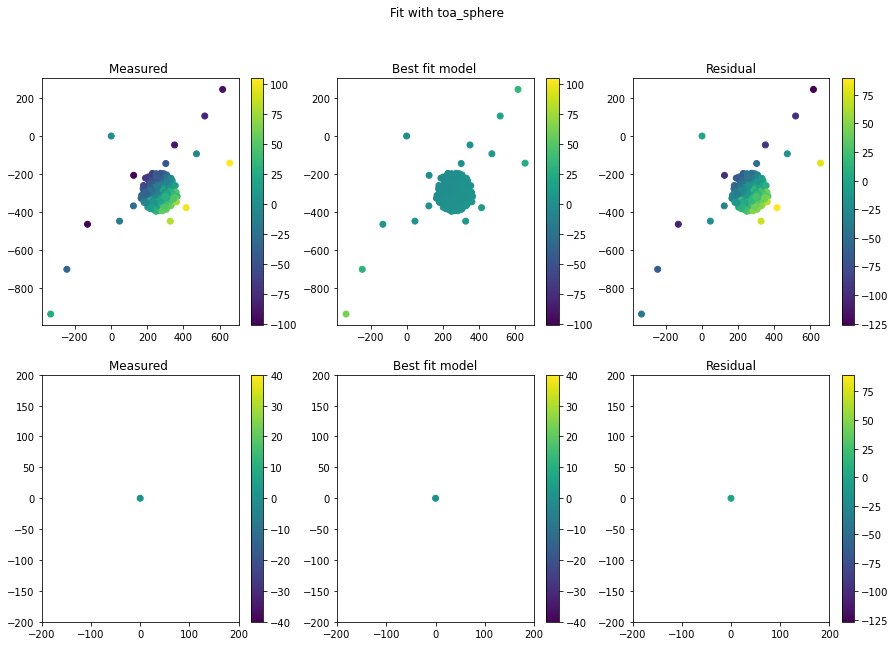

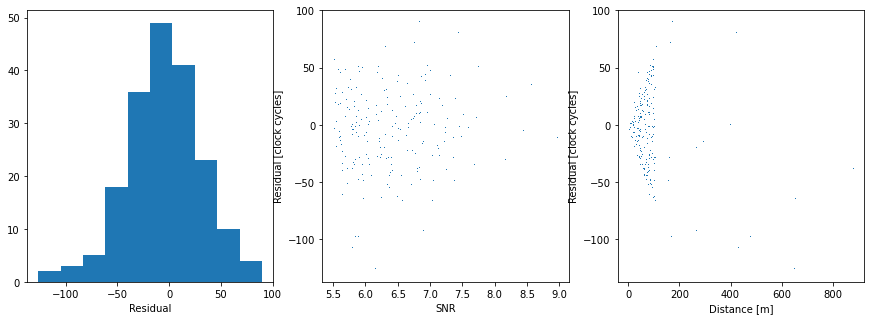

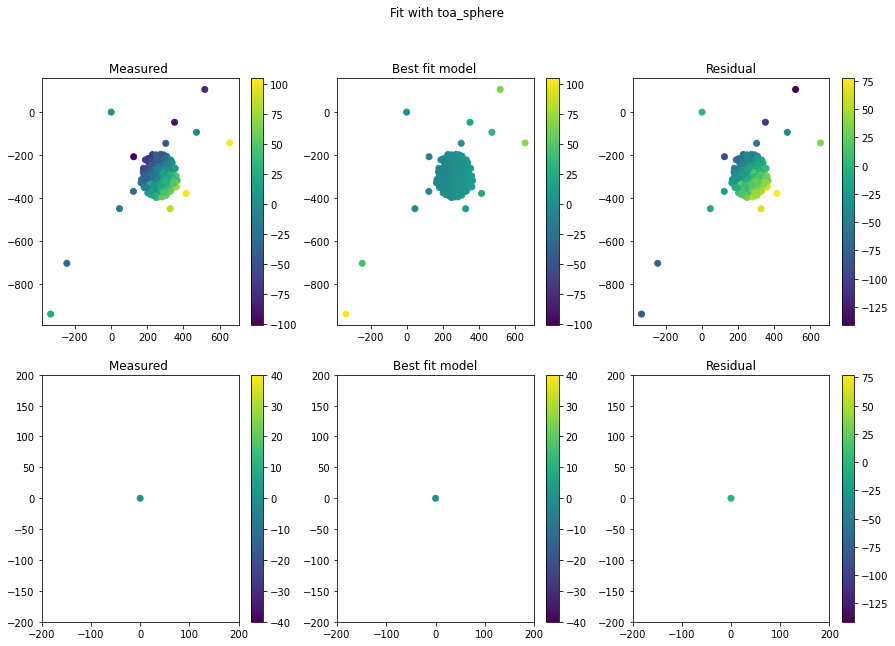

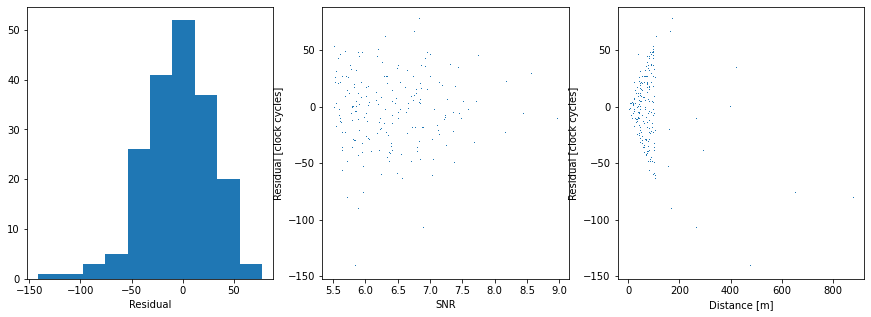

In [150]:
 datafile = '/lustre/kplant/2024October23/overnight1729764512.1530073.dat' 
index_in_file=387730
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')


Reference antenna LWA-177
Reference antenna LWA-177
Reference antenna LWA-177
arrival direction azimuth  190.002 +- 0.047 degree
Gaussian semimajor axis azimuth  18.133 +- 2.573 degree
Arrival direction ZA  63.634 +- 0.388 degree
Gaussian aspect ratio  2.276 +- 0.129
Gaussian fit rms residual  1.175
TOA fit rms residual  5.926 rms of residual weighted by snr 6.567718725346269
Reference antenna LWA-177
iteration:  0  rms residual:  7.562781068227241  n outliers:  44
popt:  [6.03153909e+01 2.01143063e+02 9.99999982e+05]
pcov:  [[ 1.99458753e-01  1.16065336e-04  1.80325684e+06]
 [ 1.16065336e-04  2.31536129e-01 -7.05725456e+06]
 [ 1.80325684e+06 -7.05725456e+06  2.95972562e+14]]
Reference antenna LWA-177
iteration:  1  rms residual:  0.538458272038782  n outliers:  4
popt:  [   60.10871794   200.35108667 16752.90575782]
pcov:  [[ 5.60865712e-03 -2.08871795e-04  1.03963883e+02]
 [-2.08871795e-04  4.85075422e-03 -2.79045425e+01]
 [ 1.03963883e+02 -2.79045425e+01  7.51551192e+06]]
Reference 

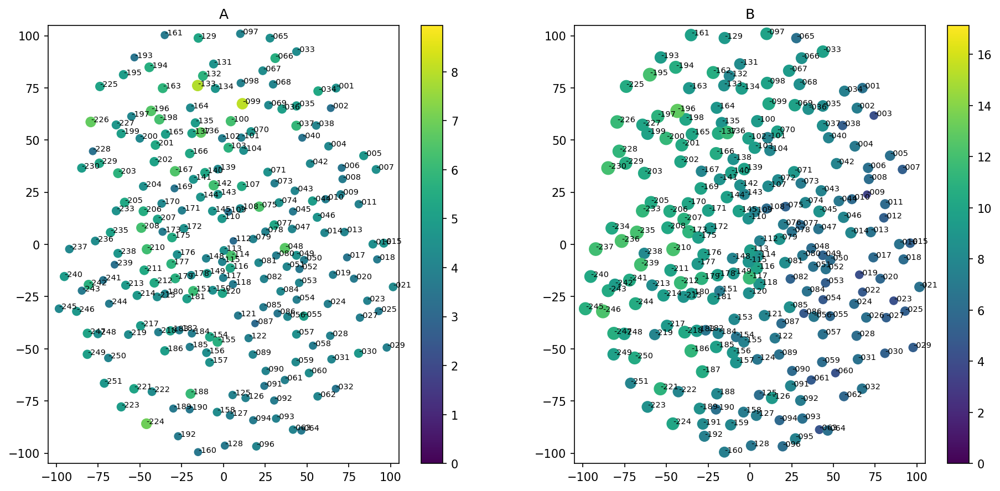

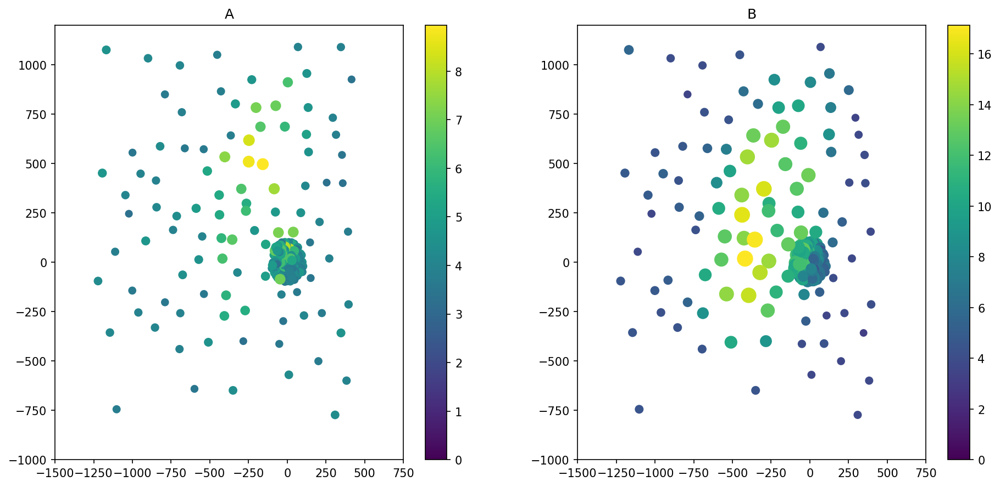

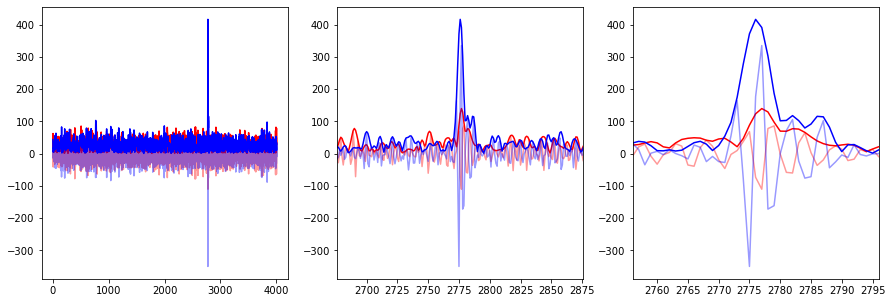

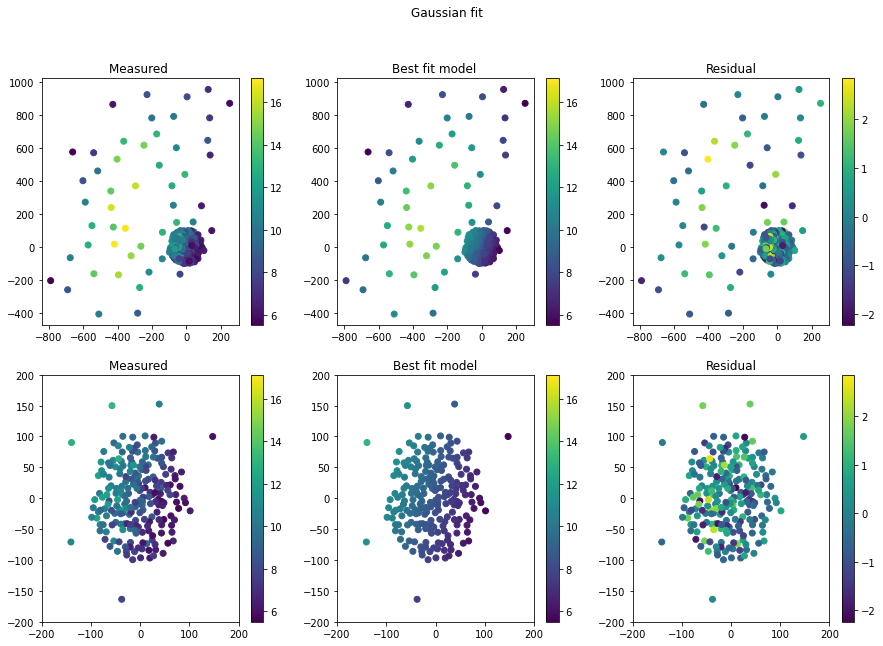

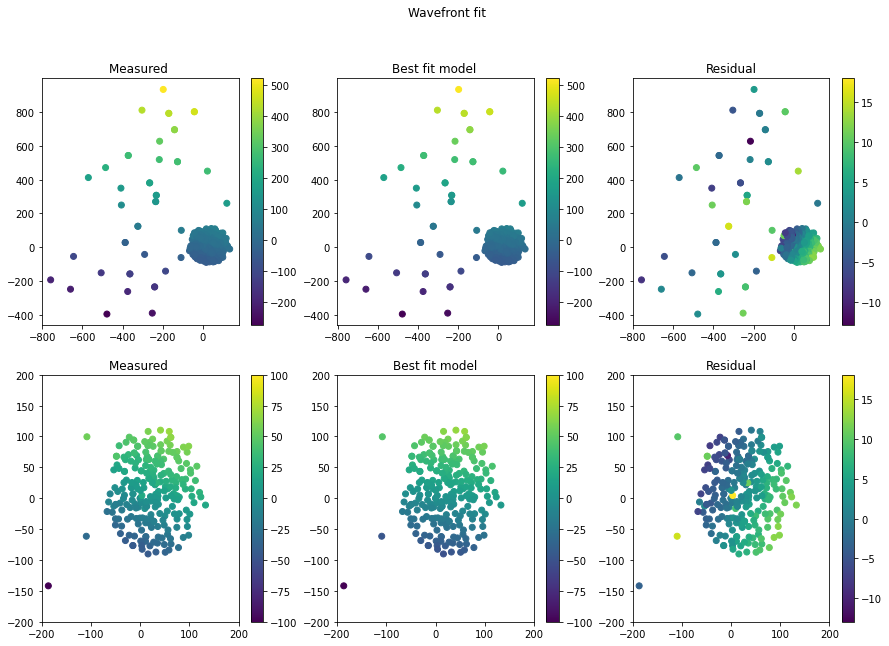

...

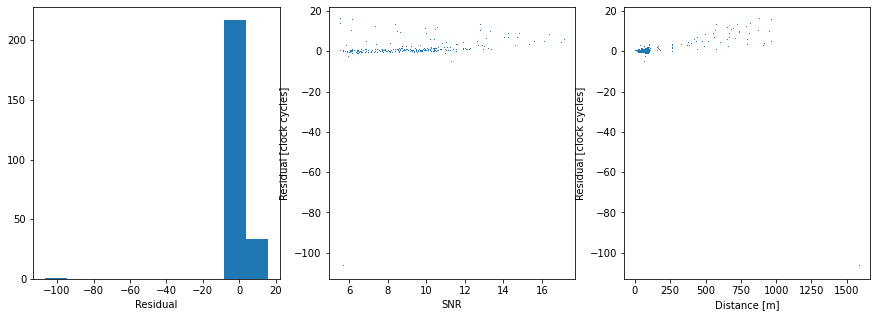

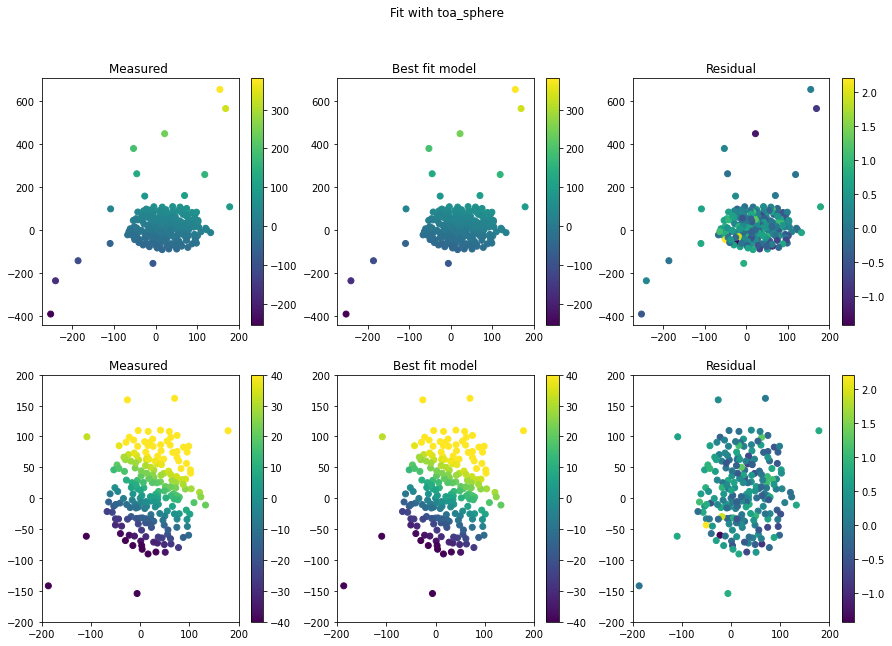

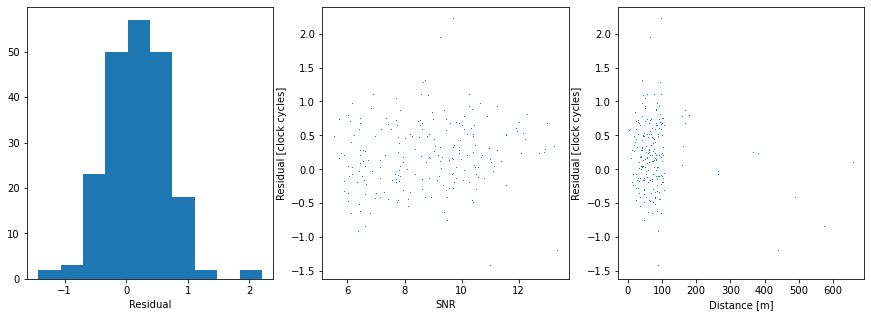

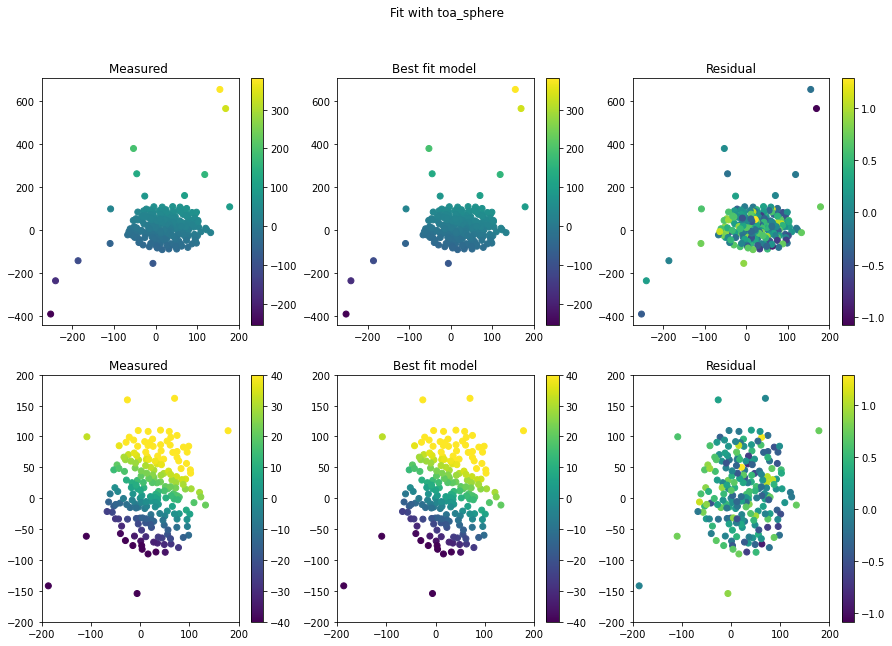

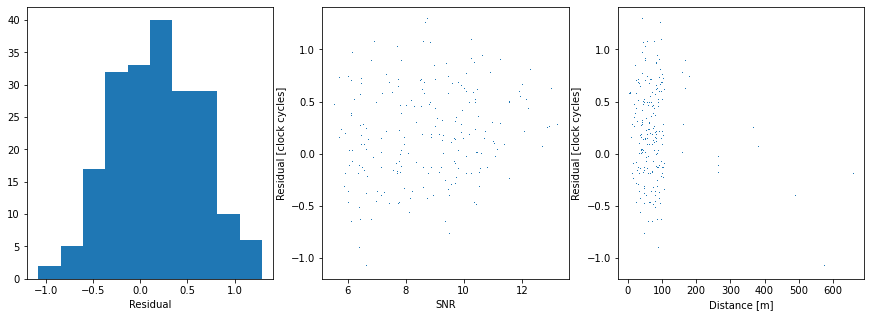

In [183]:
#Feb 21
datafile='/lustre/kplant/2024February21/overnight1708578552.9377766.dat'
index_in_file=308374
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')


Reference antenna LWA-247
Reference antenna LWA-247
Reference antenna LWA-247
arrival direction azimuth  113.242 +- 0.037 degree
Gaussian semimajor axis azimuth  180.0 +- 1568.9 degree
Arrival direction ZA  35.157 +- 0.081 degree
Gaussian aspect ratio  1.095 +- 0.143
Gaussian fit rms residual  0.915
TOA fit rms residual  0.649 rms of residual weighted by snr 0.6726946135147683
Reference antenna LWA-247
iteration:  0  rms residual:  1.730138625927413  n outliers:  12
popt:  [3.46754020e+01 1.15841534e+02 9.42506824e+05]
pcov:  [[ 9.73748836e-02  3.87877435e-02 -7.56992266e+06]
 [ 3.87877435e-02  2.58243096e-01  8.93640737e+06]
 [-7.56992266e+06  8.93640737e+06  1.78295009e+15]]
Reference antenna LWA-247
iteration:  1  rms residual:  1.010776910737671  n outliers:  0
popt:  [3.44712184e+01 1.15777265e+02 3.61472897e+05]
pcov:  [[ 1.25738309e-01 -1.31909658e-01 -4.49525031e+06]
 [-1.31909658e-01  3.82658640e-01  7.74376246e+06]
 [-4.49525031e+06  7.74376246e+06  2.07689634e+14]]
Reference

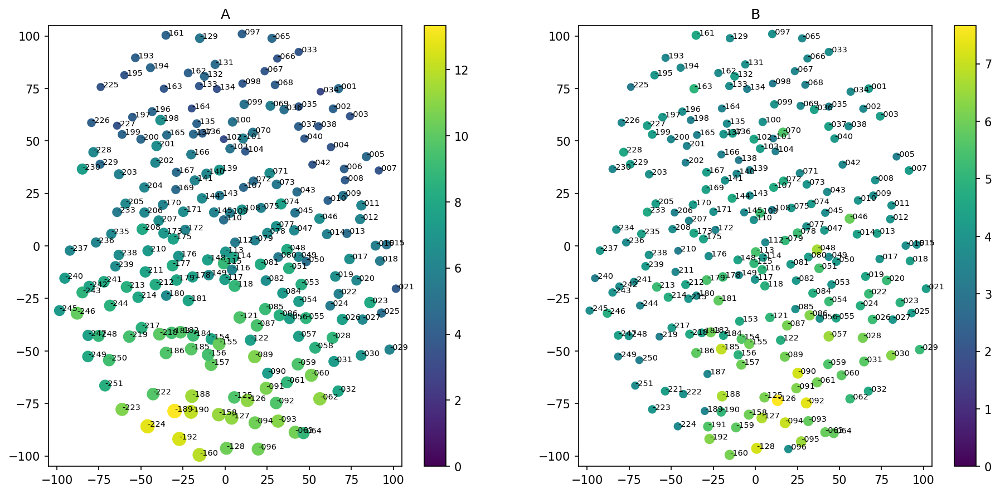

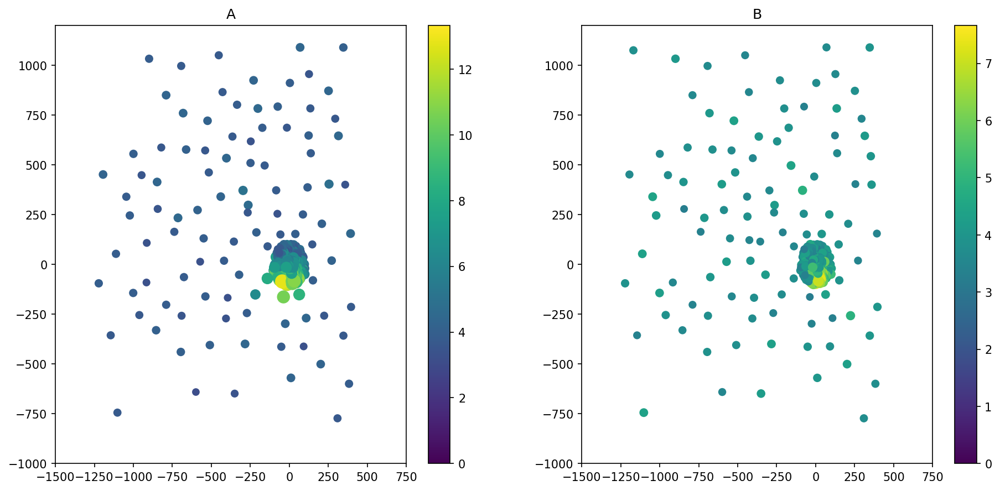

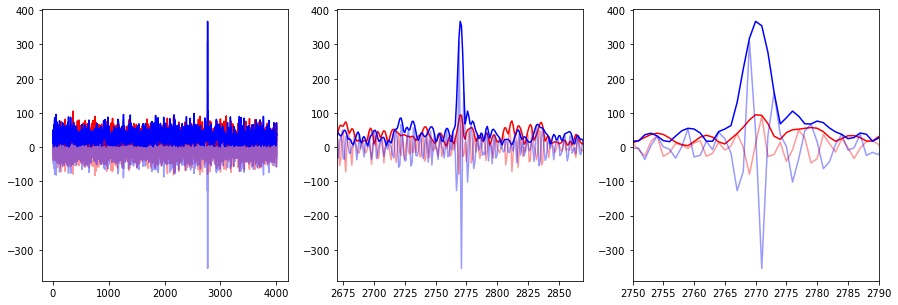

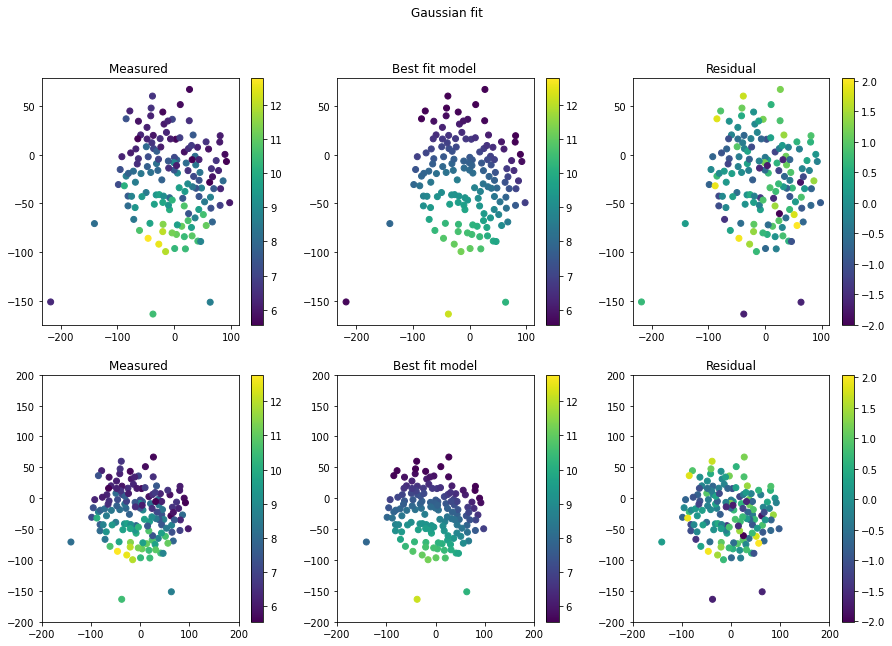

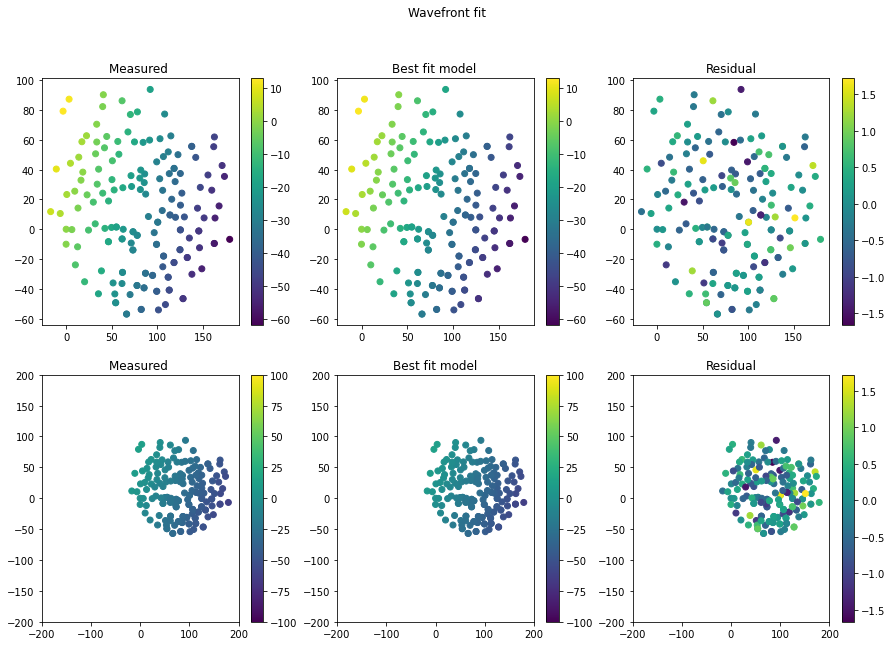

...

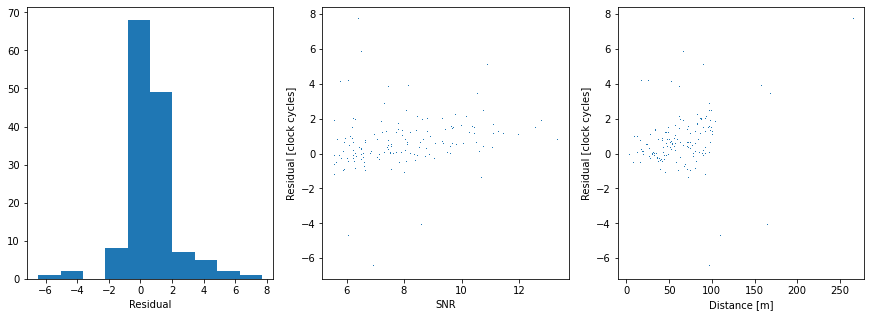

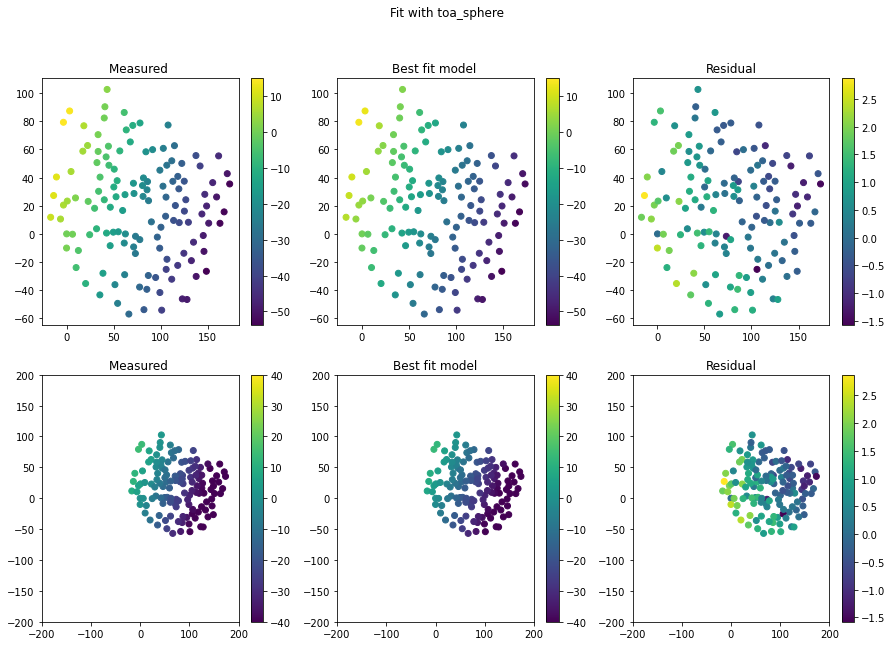

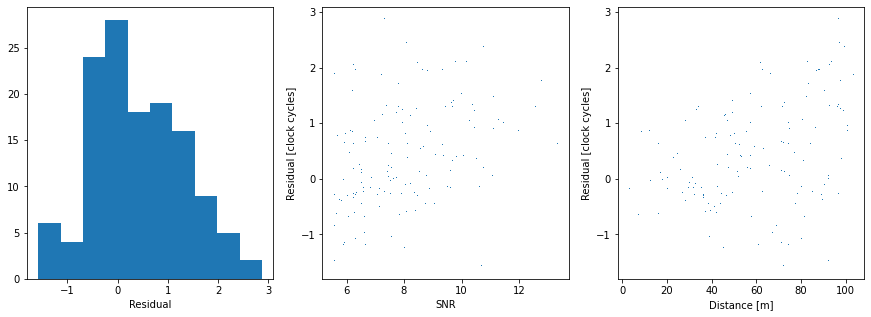

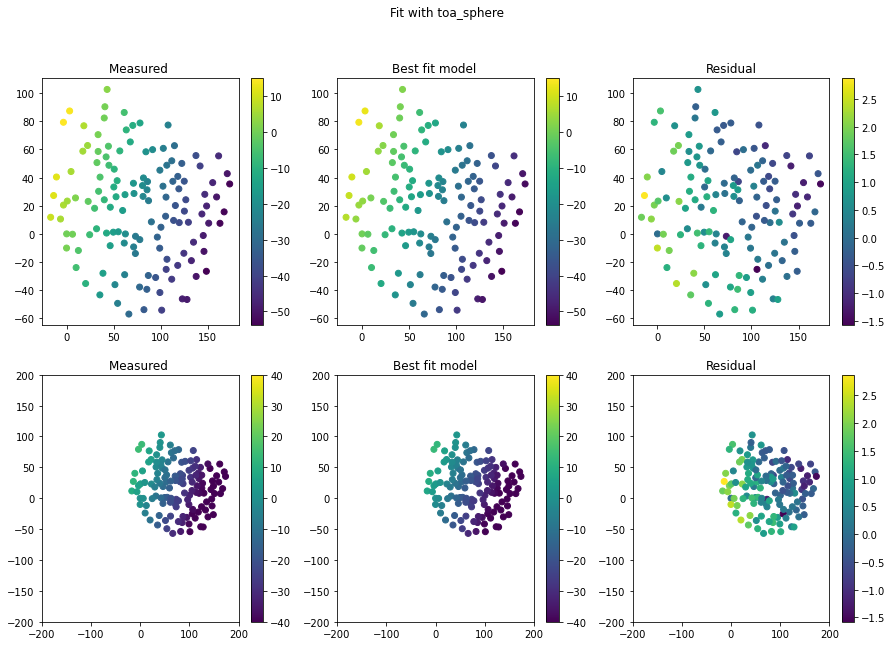

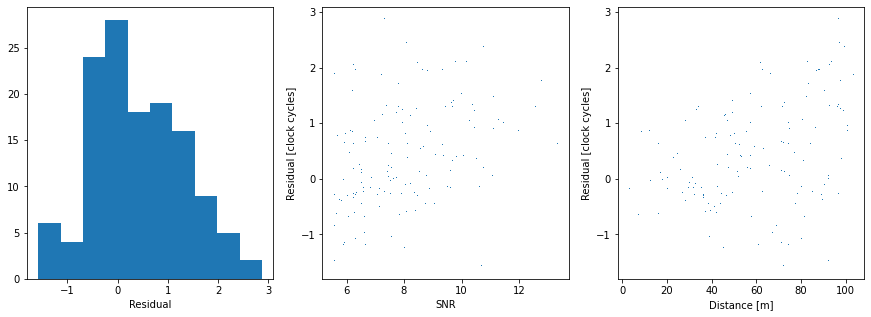

In [184]:
#April 29
datafile='/lustre/kplant/2024April29/overnight1714465069.826294.dat'
index_in_file=596047
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')



Reference antenna LWA-030
Reference antenna LWA-030
Reference antenna LWA-030
arrival direction azimuth  71.845 +- 1.11 degree
Gaussian semimajor axis azimuth  14.225 +- 156.918 degree
Arrival direction ZA  9.13 +- 0.077 degree
Gaussian aspect ratio  1.55 +- 0.213
Gaussian fit rms residual  0.853
TOA fit rms residual  0.537 rms of residual weighted by snr 0.5379591463514791
Reference antenna LWA-030
iteration:  0  rms residual:  0.5157123615985872  n outliers:  2
popt:  [   8.7914665    73.55663068 5380.5916809 ]
pcov:  [[4.95575909e-02 6.12829321e-02 3.81092407e+02]
 [6.12829321e-02 1.09210659e+00 9.22593118e+02]
 [3.81092407e+02 9.22593118e+02 3.35808441e+06]]
Reference antenna LWA-030
iteration:  1  rms residual:  0.43007356420717  n outliers:  0
popt:  [   8.78627336   73.24741336 5263.94926236]
pcov:  [[3.44391993e-02 4.32779278e-02 2.53381228e+02]
 [4.32779278e-02 7.71748703e-01 6.33200700e+02]
 [2.53381228e+02 6.33200700e+02 2.15684349e+06]]
Reference antenna LWA-030
iteration: 

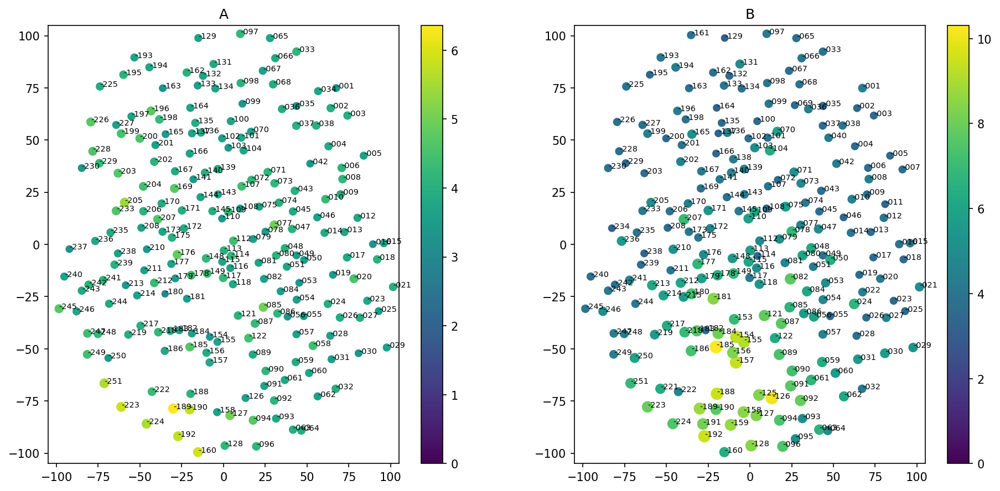

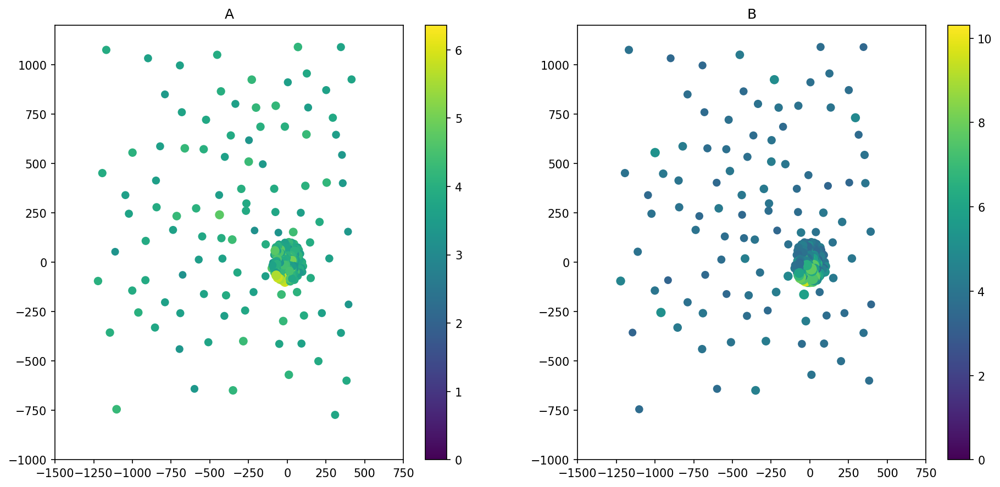

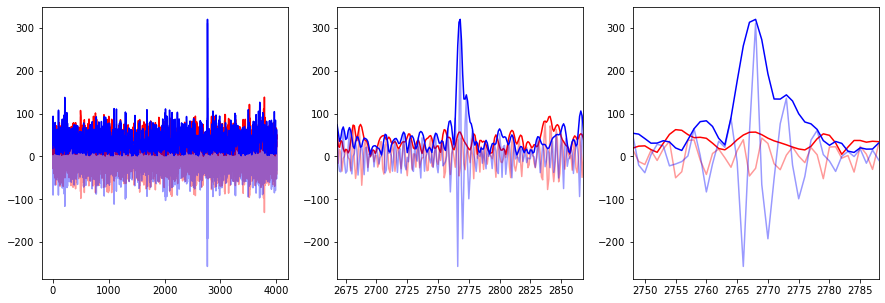

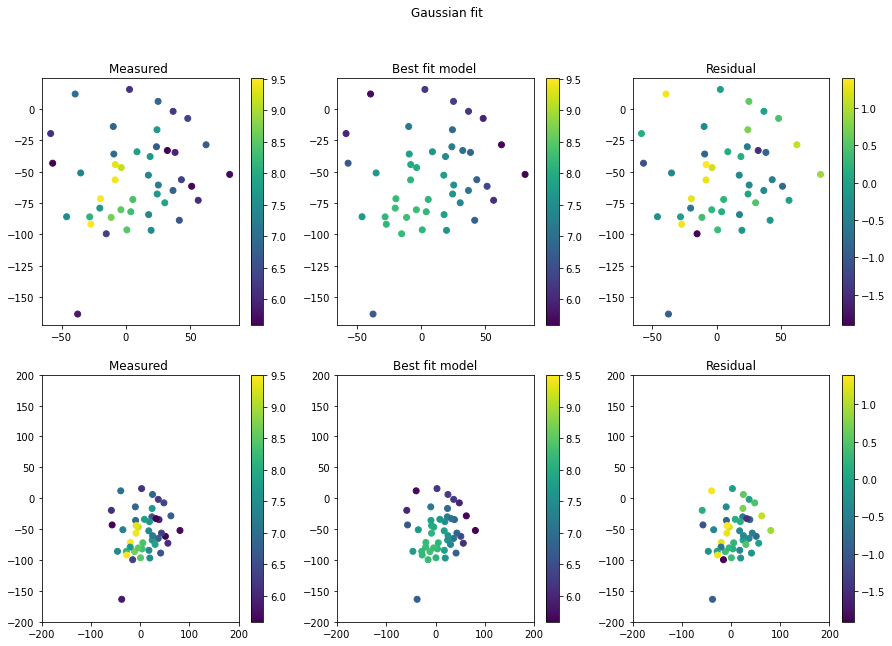

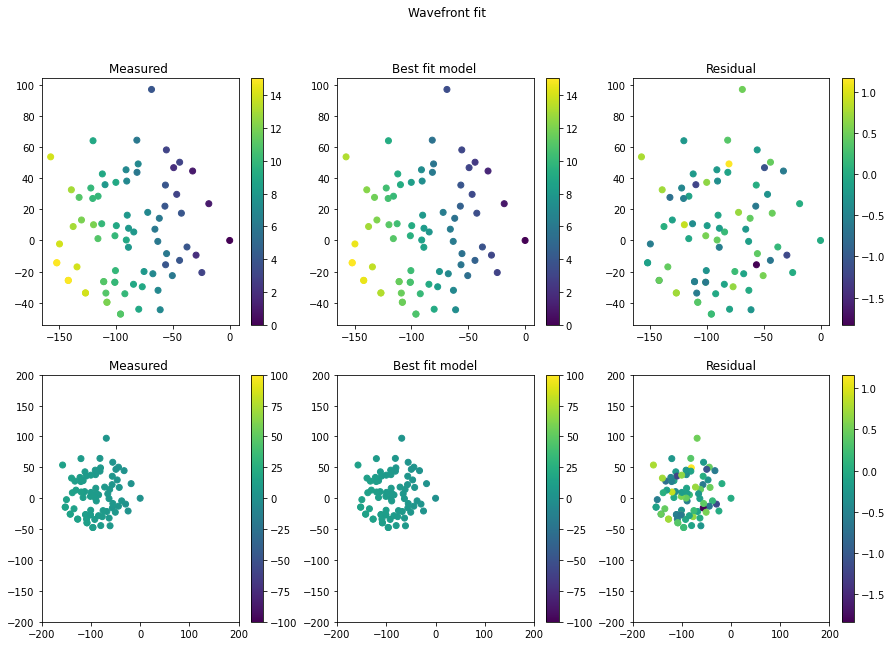

...

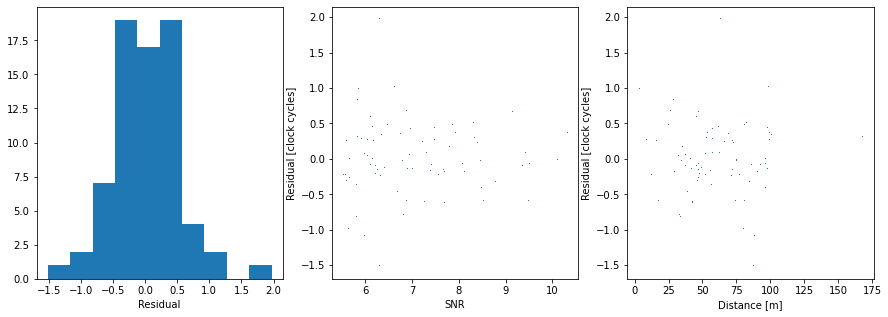

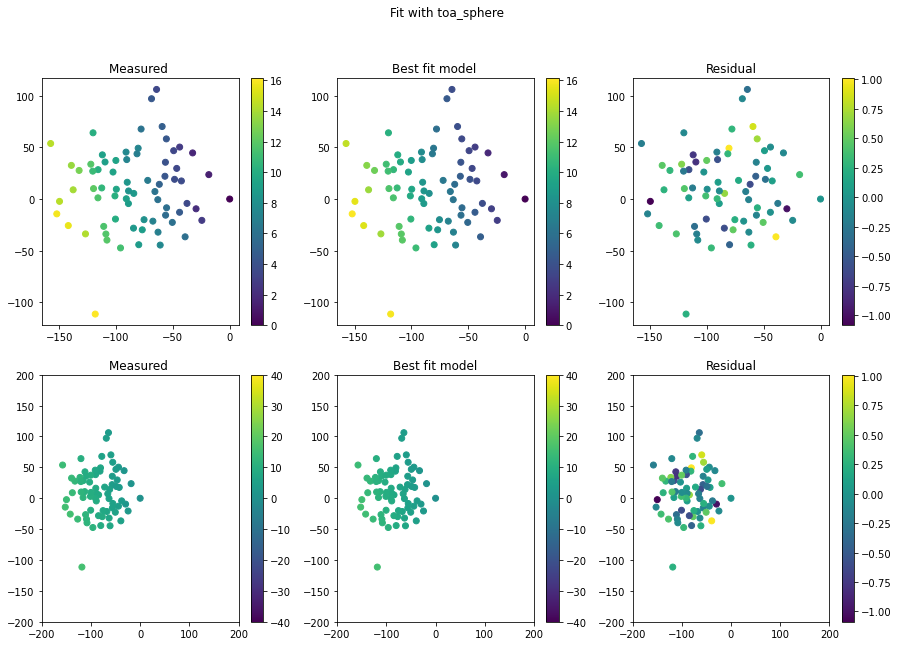

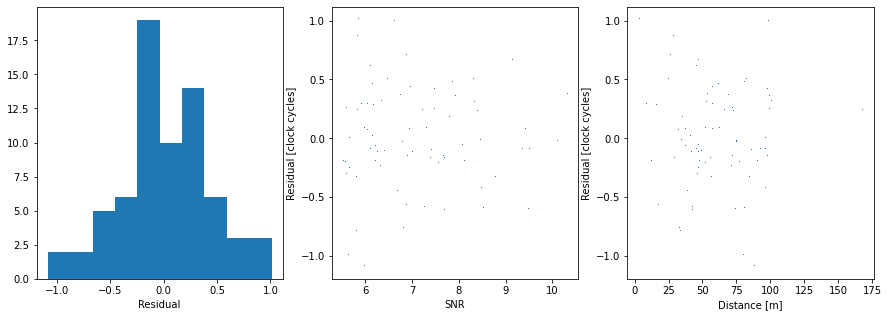

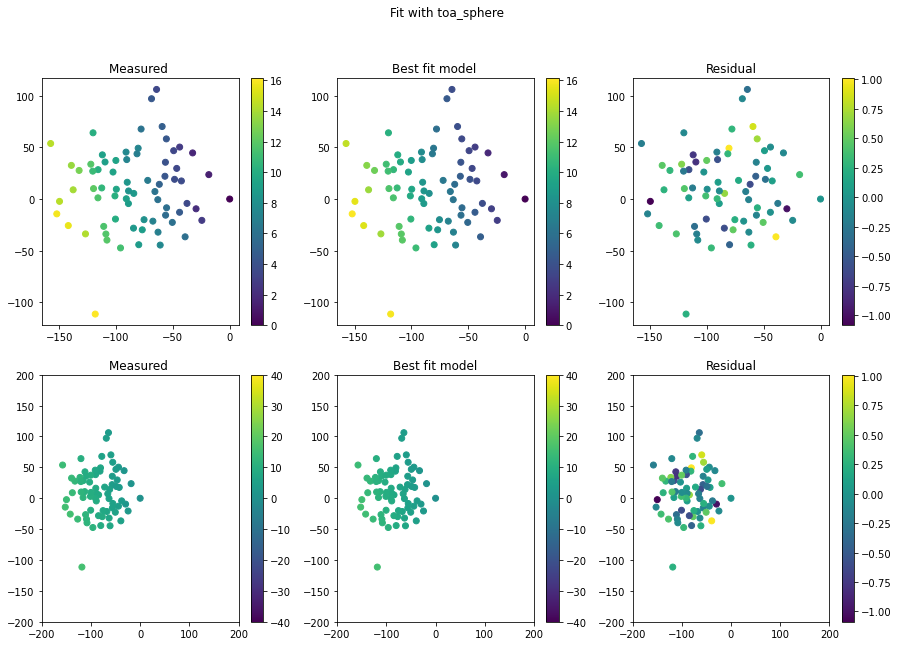

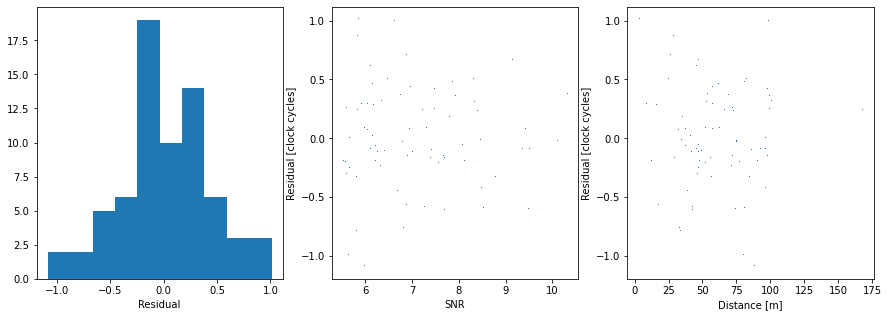

In [185]:
#April 30
datafile='/lustre/kplant/2024April30/overnight1714566721.042288.dat'
index_in_file=550832
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')



Reference antenna LWA-035
Reference antenna LWA-035
Reference antenna LWA-035
arrival direction azimuth  51.977 +- 0.05 degree
Gaussian semimajor axis azimuth  41.997 +- 114.334 degree
Arrival direction ZA  33.385 +- 0.076 degree
Gaussian aspect ratio  1.197 +- 0.071
Gaussian fit rms residual  0.918
TOA fit rms residual  1.033 rms of residual weighted by snr 1.0569476537804978
Reference antenna LWA-035
iteration:  0  rms residual:  0.7320025270490319  n outliers:  12
popt:  [  33.24026164   52.17698843 5077.6650528 ]
pcov:  [[1.28348318e-02 5.00374251e-03 6.41342529e+01]
 [5.00374251e-03 3.16190125e-02 2.28055344e+01]
 [6.41342529e+01 2.28055344e+01 5.12224844e+05]]
Reference antenna LWA-035
iteration:  1  rms residual:  0.40084833863397357  n outliers:  1
popt:  [  33.2605161    52.13625659 5234.4358718 ]
pcov:  [[4.03622101e-03 1.78918948e-03 2.11388831e+01]
 [1.78918948e-03 1.02990859e-02 9.17951065e+00]
 [2.11388831e+01 9.17951065e+00 1.81198022e+05]]
Reference antenna LWA-035
iter

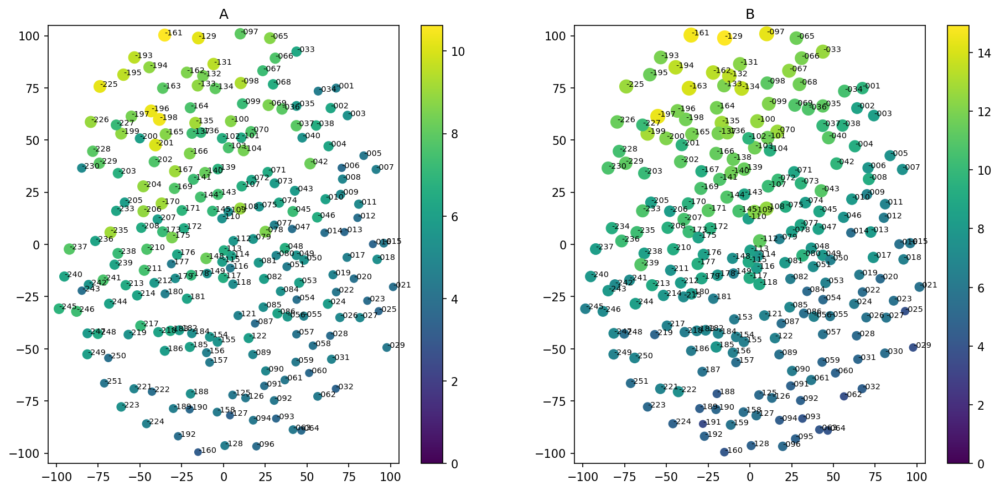

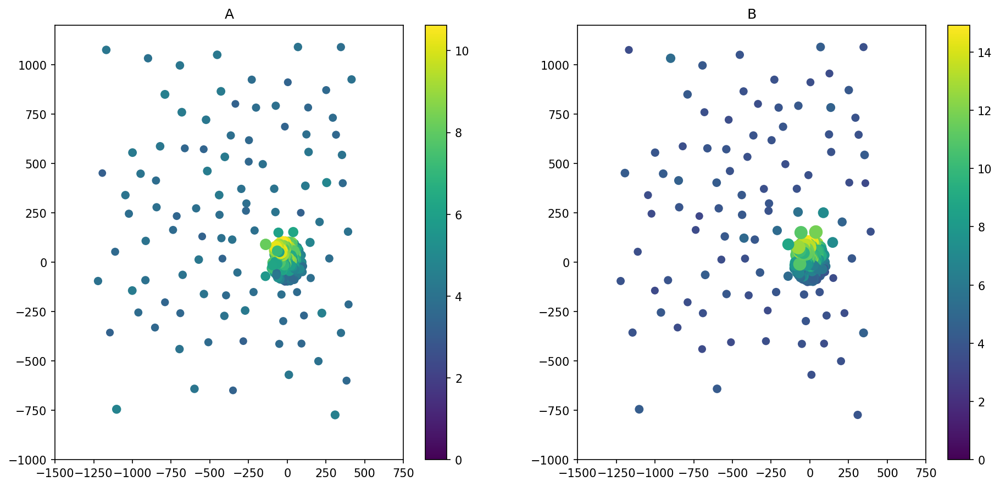

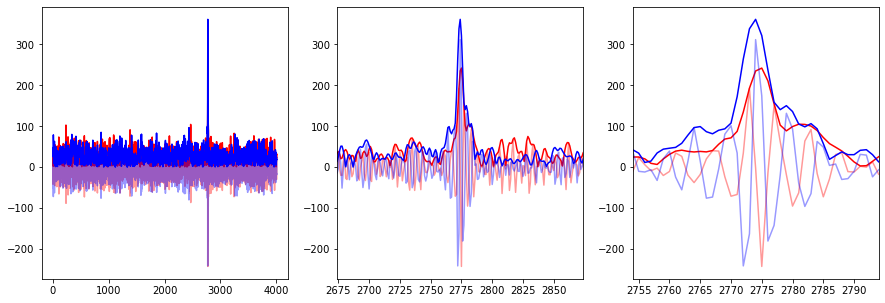

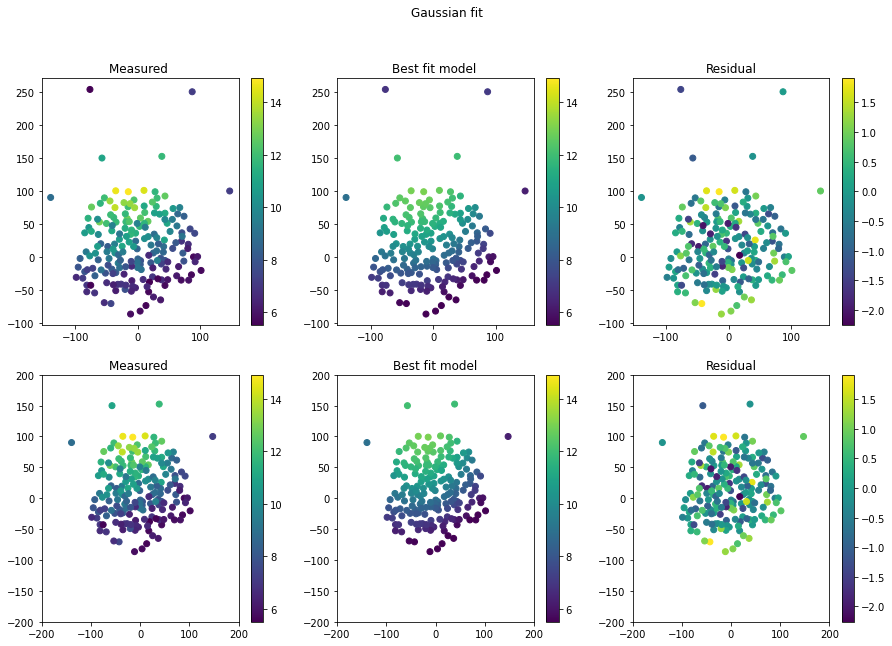

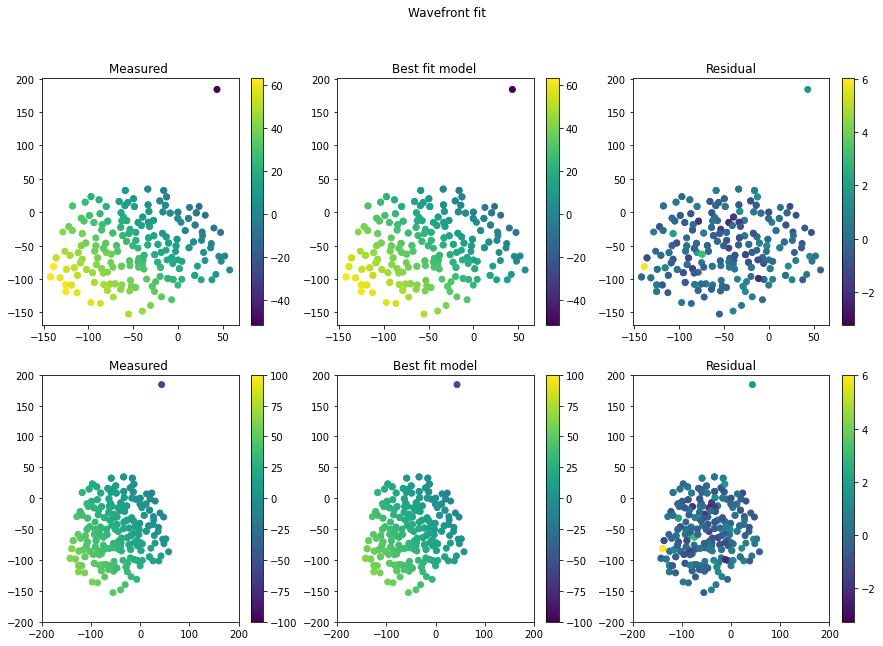

...

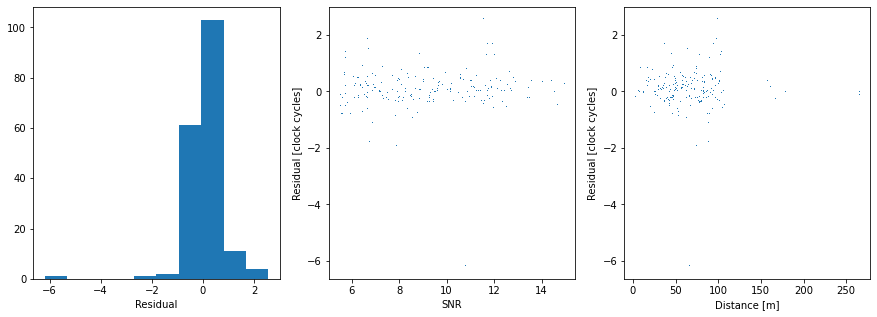

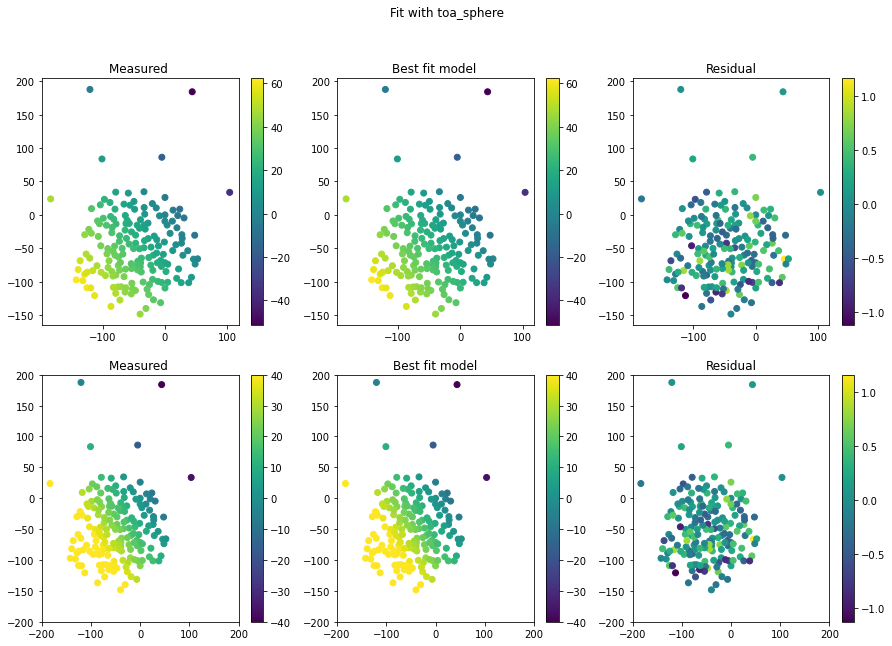

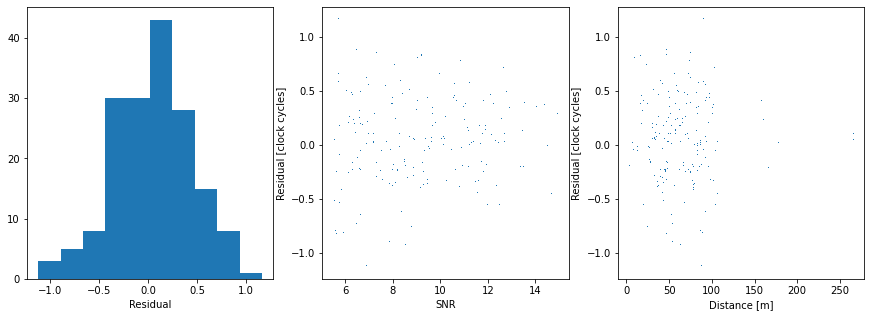

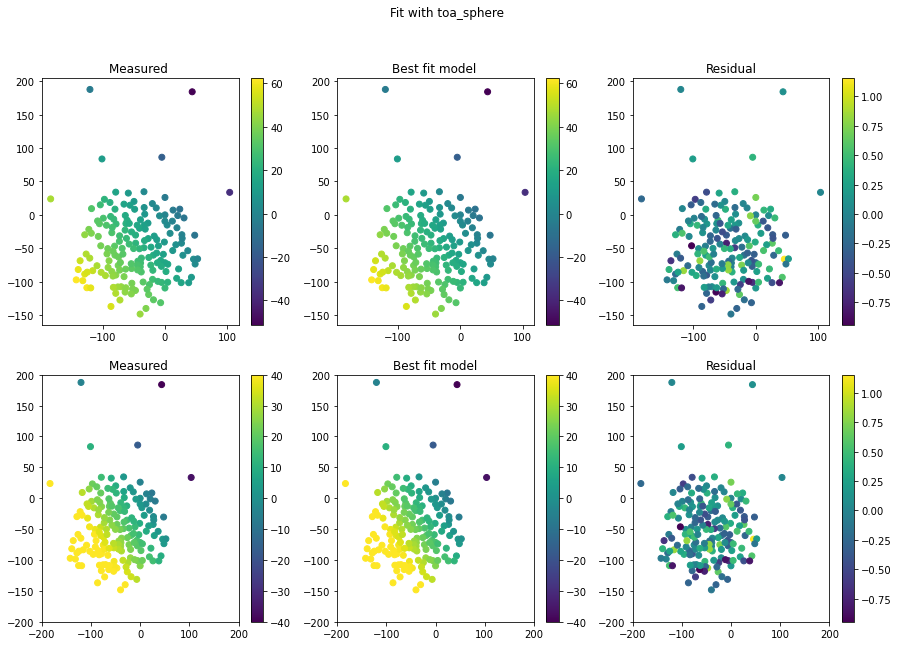

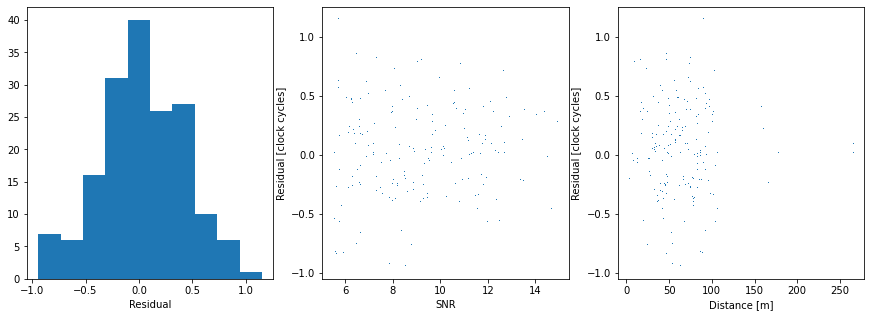

In [187]:
#May 1
datafile='/lustre/kplant/2024May1/overnight1714625018.8621984.dat'
index_in_file=572192 
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')



Reference antenna LWA-259
Reference antenna LWA-259
Reference antenna LWA-259
arrival direction azimuth  68.899 +- 0.534 degree
Gaussian semimajor axis azimuth  67.322 +- 25.63 degree
Arrival direction ZA  51.927 +- 0.596 degree
Gaussian aspect ratio  1.976 +- 0.304
Gaussian fit rms residual  1.608
TOA fit rms residual  8.7 rms of residual weighted by snr 7.418551755660158
Reference antenna LWA-259
iteration:  0  rms residual:  69.59621357574319  n outliers:  1
popt:  [ 79.47795151  68.54424536 657.47861196]
pcov:  [[  349.9756181    103.62916252 -4460.43727707]
 [  103.62916252   122.10978939 -2954.8290597 ]
 [-4460.43727707 -2954.8290597  95812.33748431]]
Reference antenna LWA-259
iteration:  1  rms residual:  1.0346358409263345  n outliers:  1
popt:  [  55.23510247   64.29499231 9107.07384628]
pcov:  [[ 2.14380922e-02  1.19331604e-02 -1.01787703e+02]
 [ 1.19331604e-02  6.63093642e-02 -3.38878287e+02]
 [-1.01787703e+02 -3.38878287e+02  2.12654038e+06]]
Reference antenna LWA-259
itera

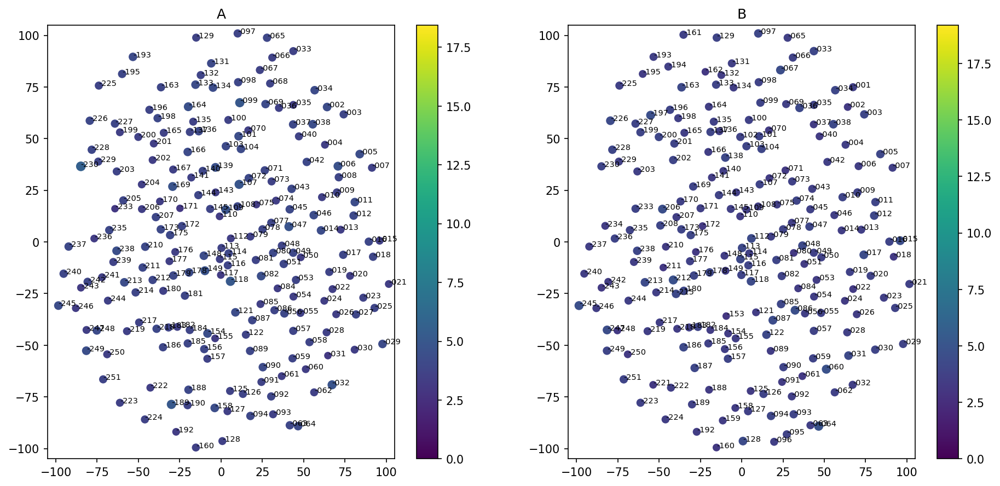

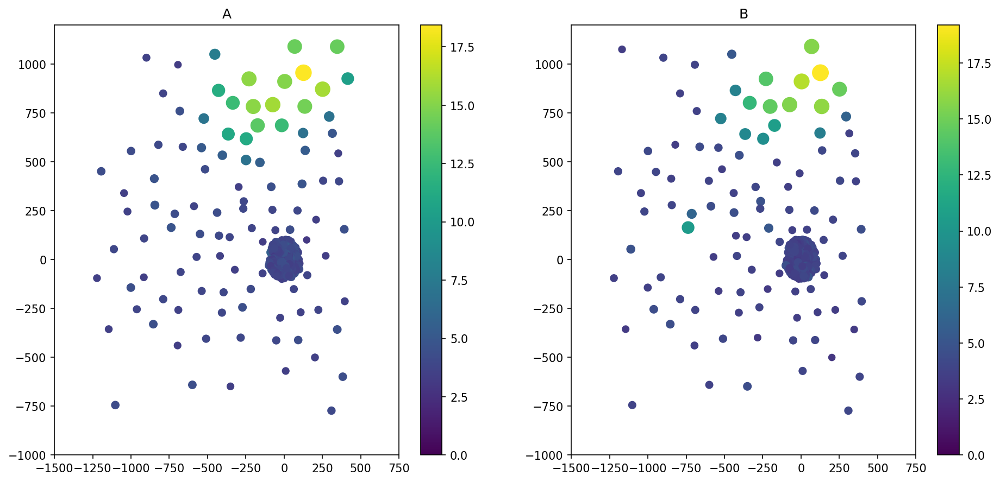

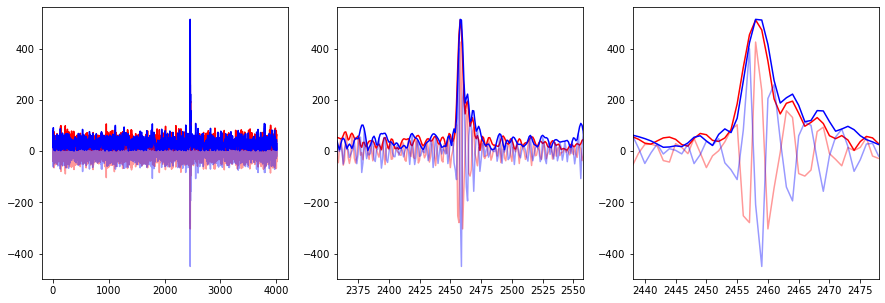

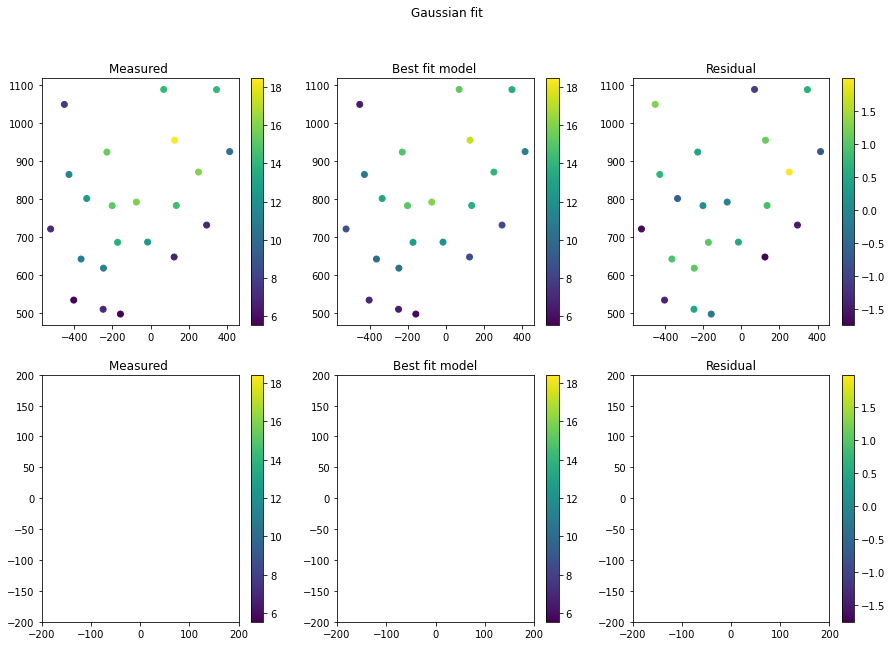

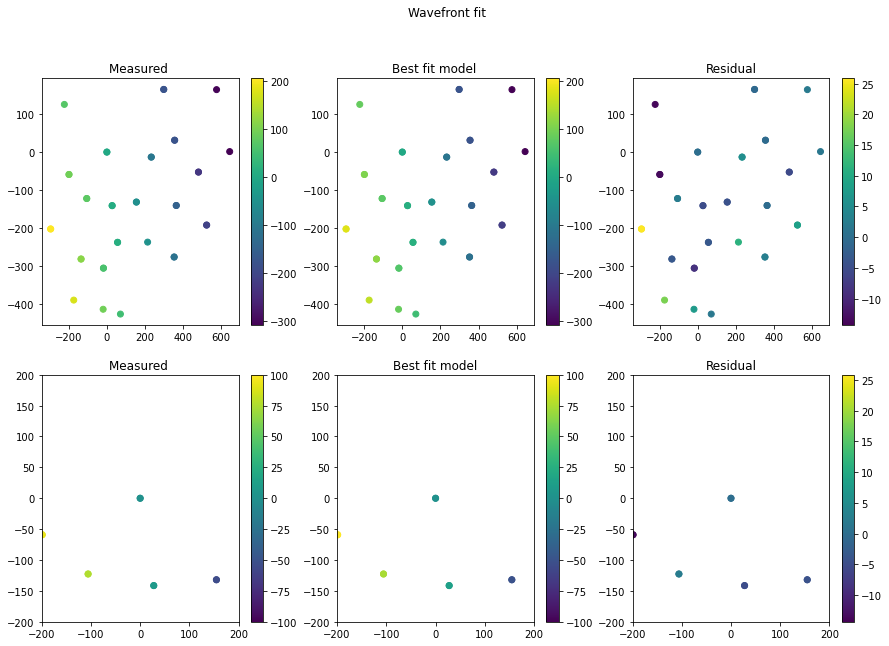

...

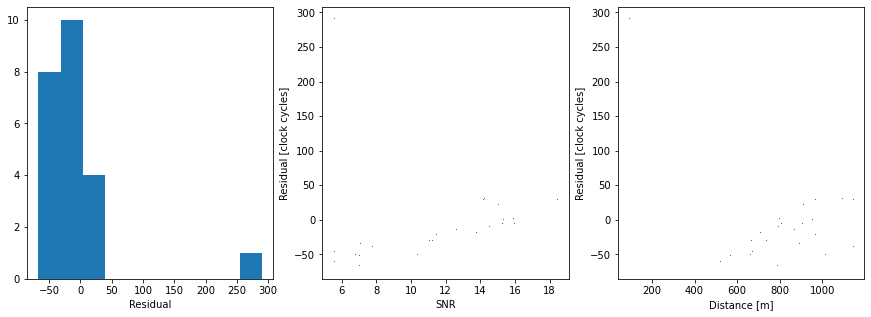

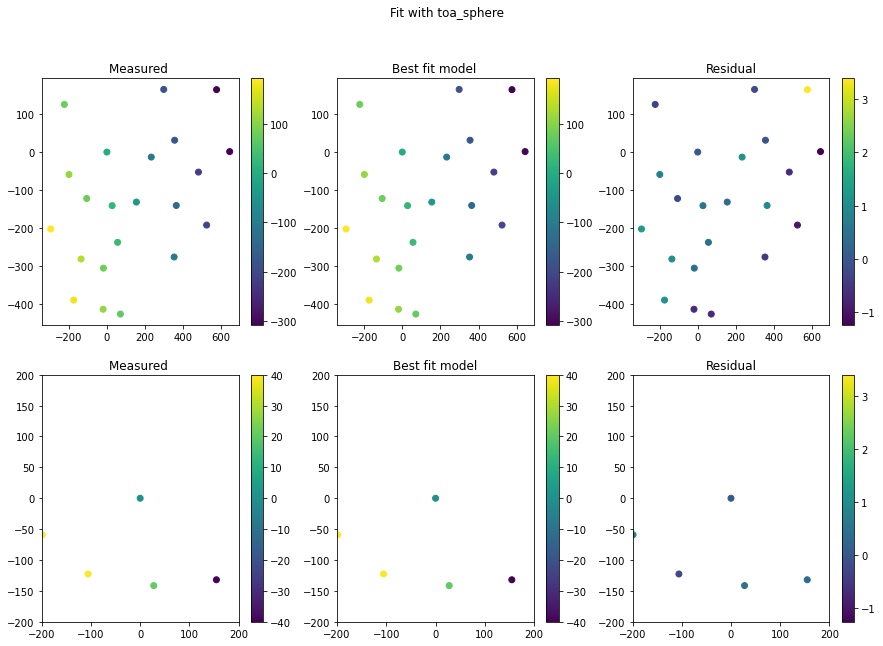

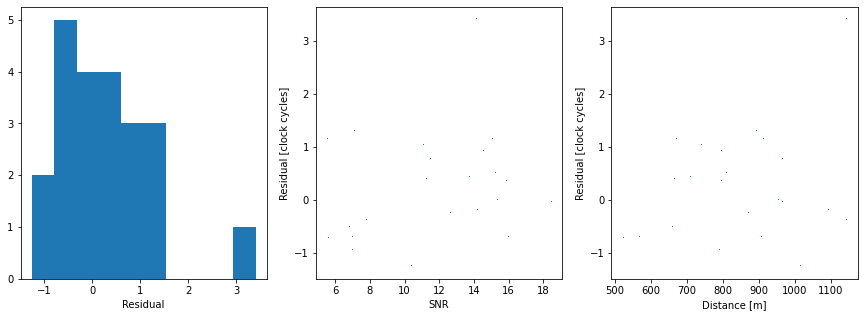

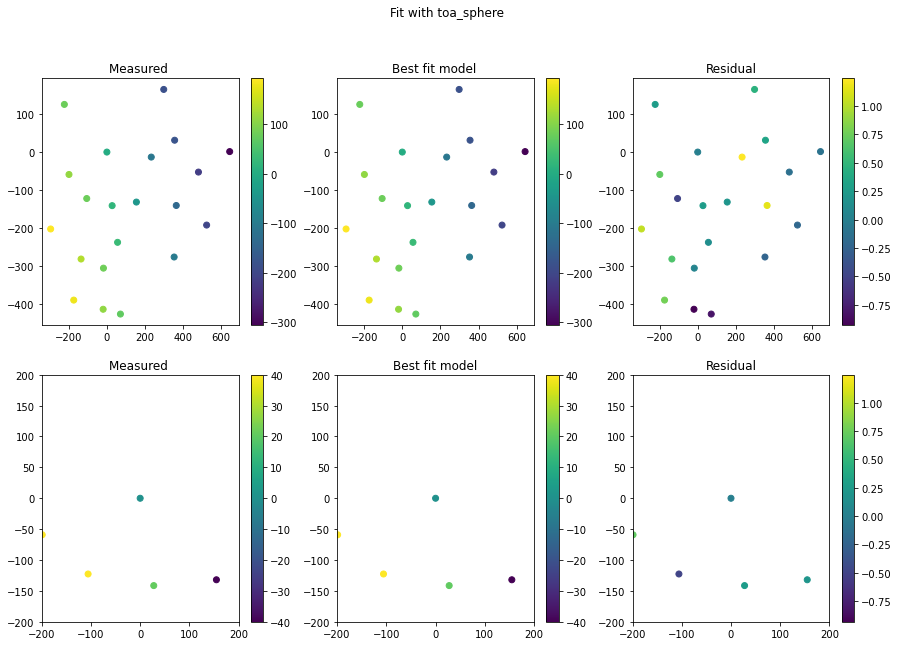

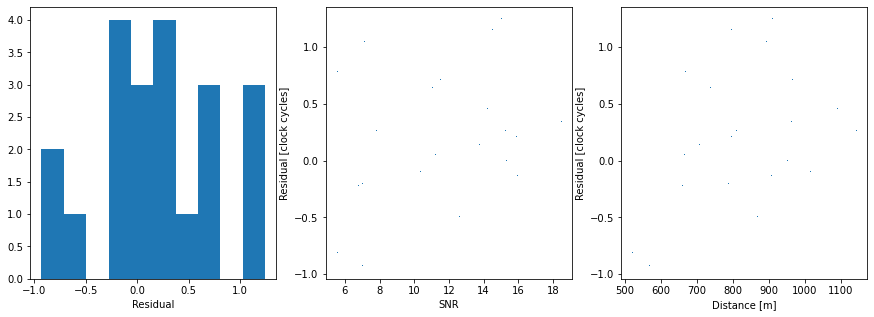

In [190]:
# May 1 other candidate
datafile='/lustre/kplant/2024May1/overnight1714635814.2075539.dat'
index_in_file=342664 
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')


Reference antenna LWA-266
Reference antenna LWA-266
Reference antenna LWA-266
arrival direction azimuth  54.659 +- 0.315 degree
Gaussian semimajor axis azimuth  55.56 +- 7.074 degree
Arrival direction ZA  60.135 +- 0.78 degree
Gaussian aspect ratio  2.467 +- 0.3
Gaussian fit rms residual  1.166
TOA fit rms residual  13.837 rms of residual weighted by snr 14.256819075493617
Reference antenna LWA-266
iteration:  0  rms residual:  1.3869620485147012  n outliers:  4
popt:  [   60.70599187    50.99789142 14366.45282427]
pcov:  [[ 1.25146315e-02 -6.93096616e-03 -1.00385083e+02]
 [-6.93096616e-03  4.63367584e-02  5.08638845e+02]
 [-1.00385083e+02  5.08638845e+02  6.31364285e+06]]
Reference antenna LWA-266
iteration:  1  rms residual:  0.8992429904874844  n outliers:  0
popt:  [   60.72468789    50.95797169 13250.75984933]
pcov:  [[ 7.88301754e-03 -5.21130275e-03 -7.40984720e+01]
 [-5.21130275e-03  2.20446292e-02  2.19419384e+02]
 [-7.40984720e+01  2.19419384e+02  2.51231185e+06]]
Reference an

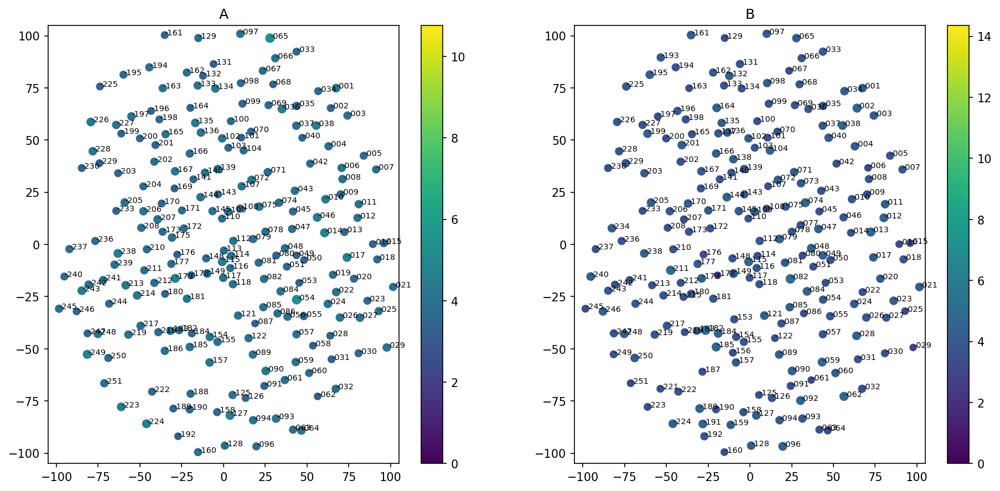

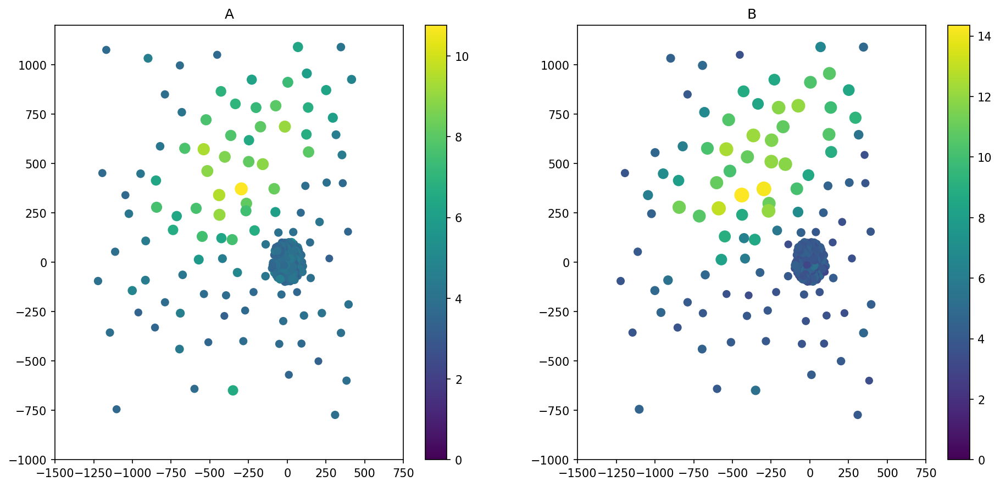

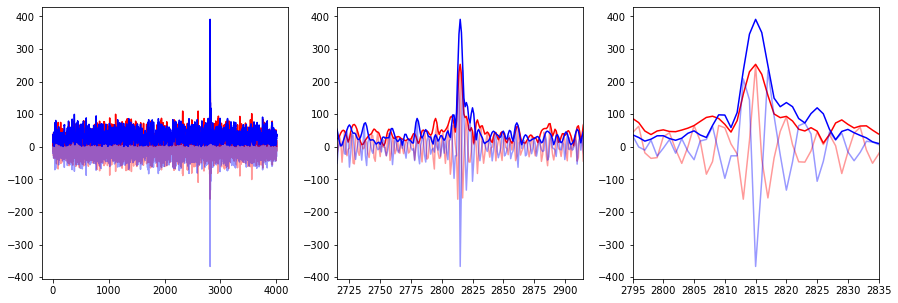

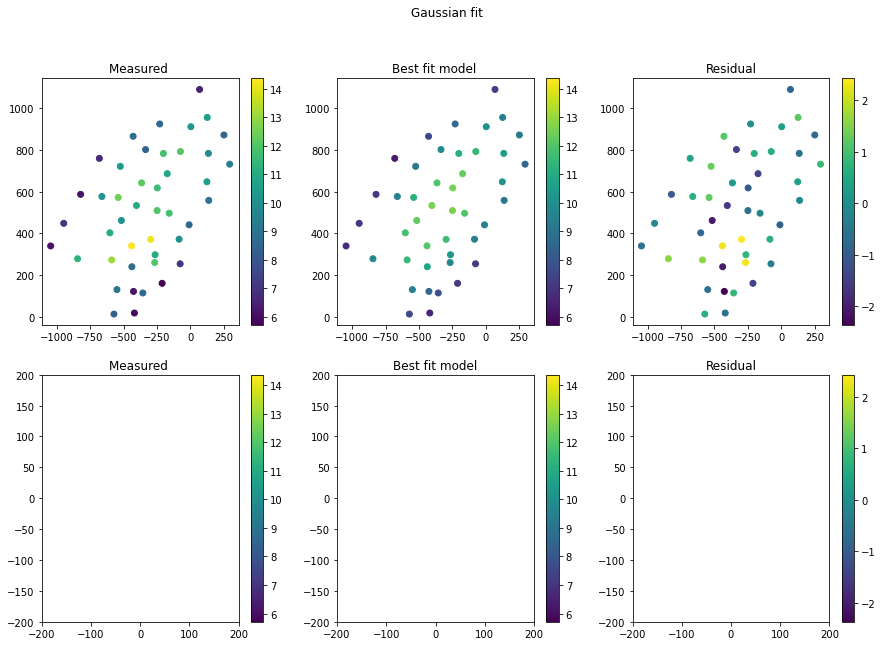

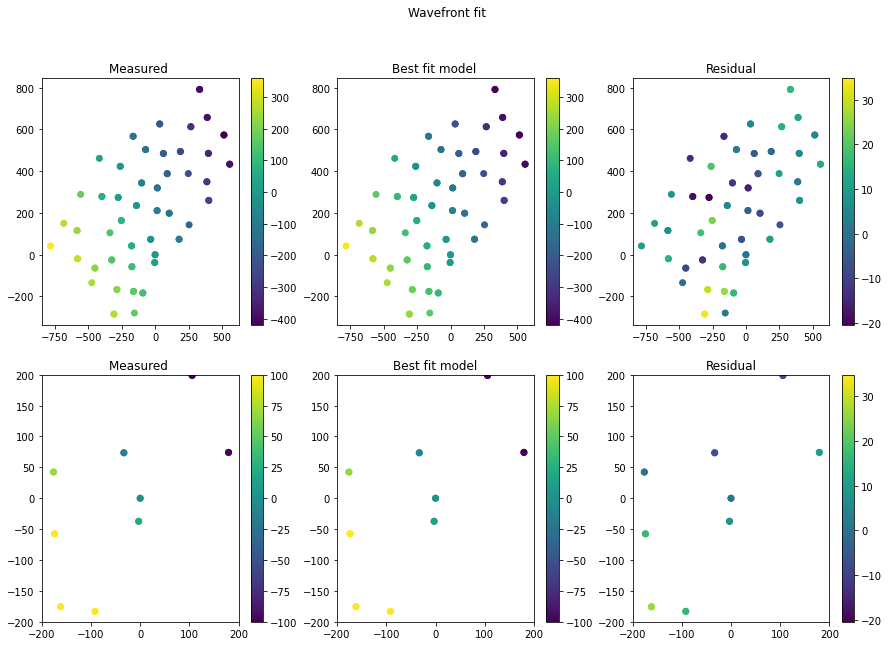

...

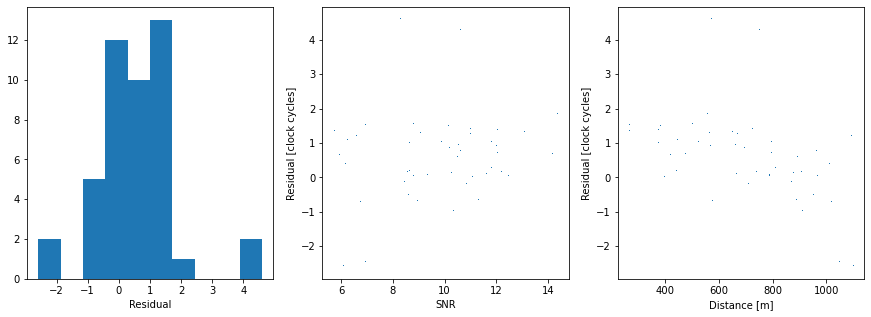

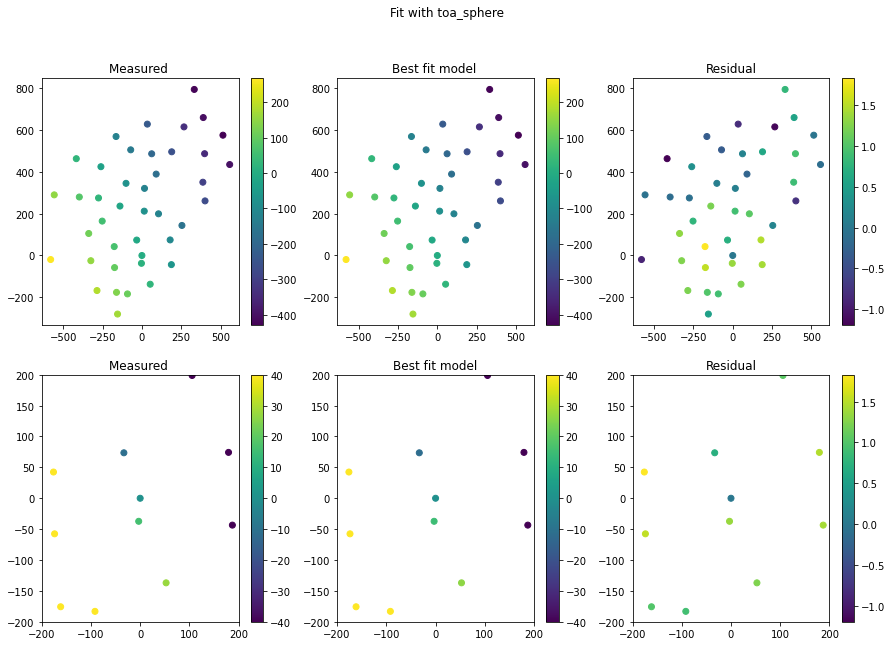

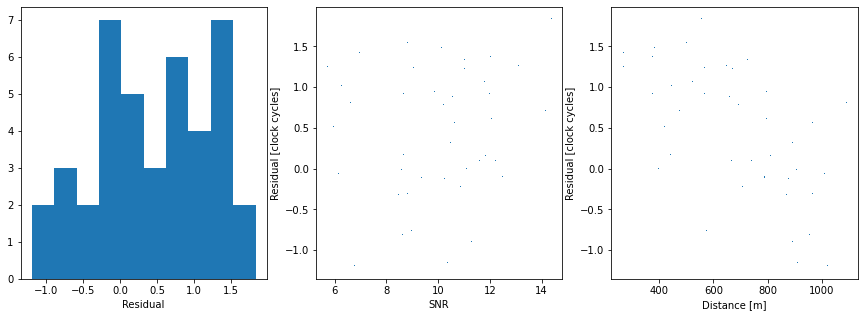

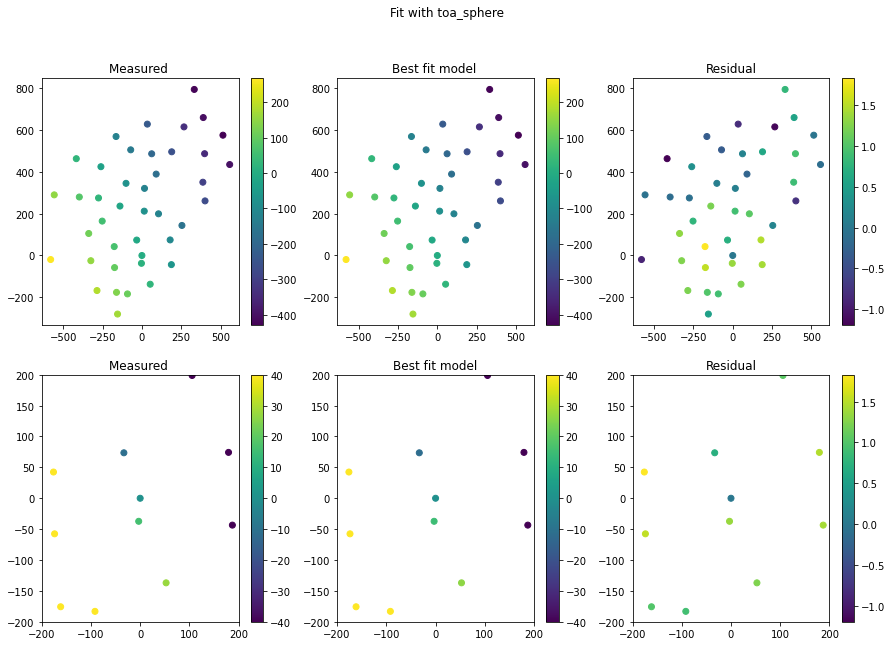

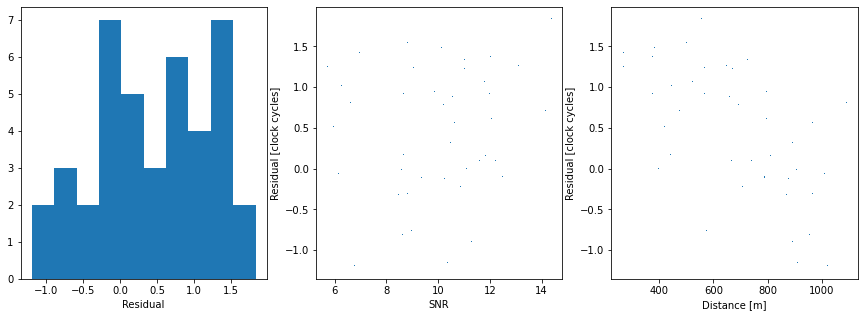

In [191]:
#May 14
datafile='/lustre/kplant/2024May14/overnight1715757000.2878973.dat'  
index_in_file=547821
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)

event_records=parsefile(datafile,start_ind=index_in_file,end_ind=704 )
event_summary=summarize_signals(event_records,np.asarray(configuration['filter']),namedict,xdict,ydict,zdict)
event_summary_flagged=flag_antennas(event_summary,configuration['maximum_ok_power'], configuration['minimum_ok_power'],
                                        configuration['minimum_ok_kurtosis'],configuration['maximum_ok_kurtosis'],1,configuration['known_bad_antennas'])[0]

minsnr=configuration['minsnr']
caltable=np.load('/home/kplant/correlator_antenna_delay_20241119.npy')

arrayforfit=apply_delay_cal(event_summary_flagged, caltable,minsnr,signflip=True)

popt,pcov,rms_residual,weighted_rms_residual,current_ant_summary_array,reference=robust_direction_fit(arrayforfit,3,4,toa_func=toa_sphere,fitbounds=([0,0,0],[90,360,1e6]),plot=True,weightbysnr=False,usecolumn='tpeak_calibrated')


In [ ]:
#May 1, probably RFI, with a somewhat-cr-like footprint
datafile='/lustre/kplant/2024May1/overnight1714624308.711313.dat'
index_in_file=468738 
quickanalysis(datafile,index_in_file,configuration,namedict,arraymapdictionaries)


# Scratch

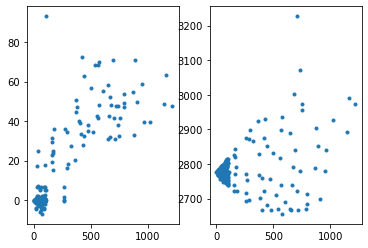

In [77]:
plt.subplot(121)
plt.plot(np.sqrt(useforfit['distance']),useforfit['CorrelatorDelay'],'.')
plt.subplot(122)
plt.plot(np.sqrt(useforfit['distance']),useforfit['tpeak_calibrated'],'.')


In [38]:
print(max(np.abs(corrdelays_reordered)))
abscorrdelay=np.abs(corrdelays_reordered)
okabscorrdelay=abscorrdelay[abscorrdelay>=0]
print(np.max(okabscorrdelay))

0.47542199701530047
0.47542199701530047


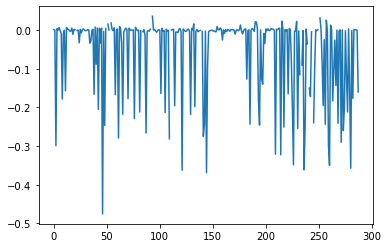

In [43]:
plt.plot(corrdelays_reordered)

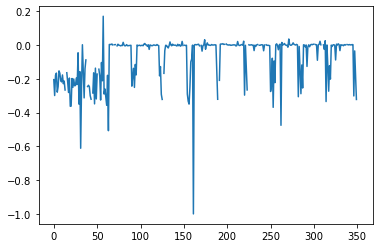

In [41]:
plt.plot(corr[0,:])


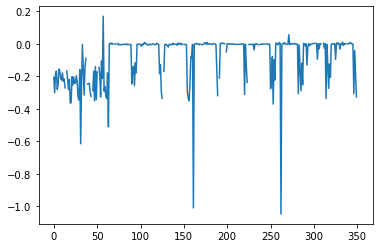

In [42]:
plt.plot(corr[1,:])